
<h2 style='text-align:center;font-size:50px;background-color:black;border:50px;color:white'>AVOCADO PROJECT REPORT <h2>

## Problem Statement:


**Avocado is a fruit consumed by people heavily in the United States.**

## Content

### This data was downloaded from the Hass Avocado Board website in May of 2018 & compiled into a single CSV. 

**The table below represents weekly 2018 retail scan data for National retail volume (units) and price. Retail scan data comes directly from retailers’ cash registers based on actual retail sales of Hass avocados.** 

**Starting in 2013, the table below reflects an expanded, multi-outlet retail data set. Multi-outlet reporting includes an aggregation of the following channels: grocery, mass, club, drug, dollar and military. The Average Price (of avocados) in the table reflects a per unit (per avocado) cost, even when multiple units (avocados) are sold in bags**

**The Product Lookup codes (PLU’s) in the table are only for Hass avocados. Other varieties of avocados (e.g. greenskins) are not included in this table.**



## Some relevant columns in the dataset:

**Date - The date of the observation**

**AveragePrice - the average price of a single avocado**

**type - conventional or organic**

**year - the year**

**Region - the city or region of the observation**

**Total Volume - Total number of avocados sold**

**4046 - Total number of avocados with PLU 4046 sold**

**4225 - Total number of avocados with PLU 4225 sold**

**4770 - Total number of avocados with PLU 4770 sold**


## Inspiration /Label :-

**The dataset can be seen in two angles to find the region and find the average price .**

**Task: One of Classification and other of Regression**

**Do both tasks in the same .ipynb file and submit at single file.**

# We will 1st do with Regression 

In [1]:
import pandas as pd 
import numpy as np
import pandas_profiling
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Now lets Load the dataset

df=pd.read_csv('avocado.csv')
df

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,7,2018-02-04,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,organic,2018,WestTexNewMexico
18245,8,2018-01-28,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,organic,2018,WestTexNewMexico
18246,9,2018-01-21,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,organic,2018,WestTexNewMexico
18247,10,2018-01-14,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,organic,2018,WestTexNewMexico


**Here in the dataset we can notice there are 14 columns which contains both Input and target variable.**

**Here "Average Price" is the target variable or Output which contains continuous data so it is a Regression type problem.**

**The dataset contains both numerical and categorical columns.**


In [3]:
df.shape

(18249, 14)

In [4]:
df.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


#### Here we can see the 1st 5 rows of the dataframe

**As seen in the dataset  above the column Unnamed is taken on the basis of index purpose which does not play any important role in the price prediction of avocado, so I am dropping this column.**

In [5]:
df.tail()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
18244,7,2018-02-04,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,organic,2018,WestTexNewMexico
18245,8,2018-01-28,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,organic,2018,WestTexNewMexico
18246,9,2018-01-21,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,organic,2018,WestTexNewMexico
18247,10,2018-01-14,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,organic,2018,WestTexNewMexico
18248,11,2018-01-07,1.62,17489.58,2894.77,2356.13,224.53,12014.15,11988.14,26.01,0.0,organic,2018,WestTexNewMexico


#### Here we can see the last 5 rows of the dataframe

In [6]:
df.sample(5)


,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
13967,6,2016-11-13,1.17,9499.50,65.30,2932.56,0.00,6501.64,1297.20,5204.44,0.00,organic,2016,Roanoke
9108,6,2018-02-11,0.93,7463494.79,2646176.67,1633418.28,109146.92,3074752.92,1203367.03,1856207.85,15178.04,conventional,2018,West
4254,42,2016-03-06,0.97,267953.78,150786.30,27025.48,565.65,89576.35,74664.71,14911.64,0.00,conventional,2016,NewOrleansMobile
11500,34,2015-05-03,1.43,42345.48,25704.97,4666.48,0.00,11974.03,11190.00,784.03,0.00,organic,2015,SouthCentral
612,40,2015-03-22,0.67,1333424.37,925527.04,297656.40,11678.42,98562.51,88559.01,9991.57,11.93,conventional,2015,DallasFtWorth


#### Here we are getting randomly any 5 rows from the datset ..

#### As seen in the dataset the column Unnamed:0 is taken on the basis of index purpose which does not play any important role in the price prediction of avocado, so I am dropping this column.

In [7]:
df.columns

Index(['Unnamed: 0', 'Date', 'AveragePrice', 'Total Volume', '4046', '4225',
       '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type',
       'year', 'region'],
      dtype='object')

In [8]:
# Dropping the column Unnamed:0 bcz its useless for predictions
df.drop("Unnamed: 0",axis=1, inplace=True)

In [9]:
df.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [10]:
# Now lets identify which types of data types do they all belongs

df.dtypes

Date             object
AveragePrice    float64
Total Volume    float64
4046            float64
4225            float64
4770            float64
Total Bags      float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
type             object
year              int64
region           object
dtype: object

#### As we can see that Data columns is in object format which is needed to be corrected.. Average Price which is ourr Target variable which is in continuous format that mean regression problem..AveragePrice ,Total Volume   ,4046   ,4225   ,4770  ,Total Bags  ,SmallBags ,Large Bags    are in float 64 ,type is in object and year is in int 64 and region in object 

## Before Moving ahead as we can see that our Date column is in Object format which is required to be corrected ,so lets correct it 1st.

In [11]:
# Changing date column from object type to Date Type
df['Date']=pd.to_datetime(df['Date'])

In [12]:
df['Month']=df['Date'].apply(lambda x:x.month)
df['Day']=df['Date'].apply(lambda x:x.day)

In [13]:
df.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,27
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,20
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,13
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,6
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,29


In [14]:
# Now Lets Drop Date columns from the dataset bcz we have already made the columns for Month and day in the dateset above 
# Year columns was already pre mentioned in the dateset

df.drop("Date",axis=1,inplace=True)

In [15]:
df.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,27
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,20
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,13
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,6
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,29


In [16]:
# Lets see Unique Values inside the target variables
df['AveragePrice'].unique()

array([1.33, 1.35, 0.93, 1.08, 1.28, 1.26, 0.99, 0.98, 1.02, 1.07, 1.12,
       1.31, 1.11, 1.34, 1.45, 1.05, 1.37, 1.27, 1.32, 1.23, 1.19, 1.43,
       1.2 , 1.22, 1.13, 1.16, 1.06, 1.17, 1.24, 0.96, 1.  , 1.09, 0.95,
       0.97, 1.15, 1.01, 1.14, 1.1 , 1.04, 1.03, 1.18, 1.29, 1.25, 0.71,
       0.94, 0.91, 1.39, 1.4 , 1.36, 1.3 , 1.54, 1.59, 1.56, 1.38, 1.49,
       1.5 , 1.47, 1.42, 1.41, 1.44, 1.52, 0.9 , 0.87, 0.78, 0.92, 0.83,
       0.88, 0.84, 0.85, 1.21, 0.79, 0.89, 0.86, 0.8 , 0.82, 0.74, 0.81,
       0.77, 0.75, 0.65, 0.73, 0.68, 0.72, 0.67, 0.76, 0.62, 0.7 , 0.66,
       1.46, 0.49, 0.53, 0.56, 0.6 , 0.58, 0.54, 0.52, 0.51, 0.57, 0.63,
       0.64, 0.61, 1.48, 1.55, 1.58, 1.53, 1.57, 1.51, 0.69, 1.62, 1.63,
       1.61, 1.6 , 1.73, 1.8 , 1.86, 1.85, 1.69, 1.66, 1.65, 1.64, 1.67,
       1.68, 1.82, 2.07, 1.84, 1.83, 1.7 , 1.72, 1.81, 1.78, 0.59, 1.9 ,
       1.93, 1.99, 1.95, 1.89, 1.76, 1.71, 1.74, 0.55, 1.79, 1.75, 1.94,
       2.2 , 1.87, 1.77, 2.06, 2.11, 2.22, 2.14, 2.

#### we can see that there are lot of null values inside the target variables

In [17]:
len(df['AveragePrice'])


# total lenght of the target columns

18249

In [18]:
df['AveragePrice'].value_counts()

1.15    202
1.18    199
1.08    194
1.26    193
1.13    192
       ... 
3.25      1
3.12      1
2.68      1
3.03      1
3.17      1
Name: AveragePrice, Length: 259, dtype: int64

#### Its shows  the value counts of each number present inside this columns

<h2 style='text-align:center;font-size:40px;background-color:black;border:35px;color:white'> Checking Null Values in the dataframe <h2>


In [19]:
df.isnull()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,False,False,False,False,False,False,False,False,False,False,False,False,False,False
18245,False,False,False,False,False,False,False,False,False,False,False,False,False,False
18246,False,False,False,False,False,False,False,False,False,False,False,False,False,False
18247,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [20]:
df.isnull().sum()

AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
Month           0
Day             0
dtype: int64

#### Here in the dataframe we can see that we have Zero Null Values in all the columns

<AxesSubplot:>

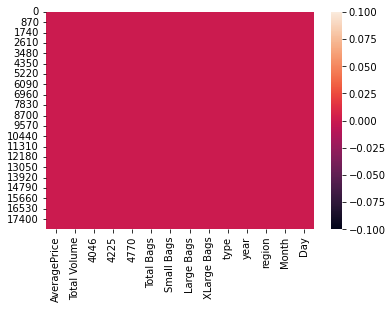

In [21]:
sns.heatmap(df.isnull())

#### By Heatmap We can graphically present and see Null Values in the dataframe...Here we can see Zero(0) Null values in all the columns

<h2 style='text-align:center;font-size:40px;background-color:black;border:35px;color:white'> EDA <h2>


In [22]:
#Checking again the shape of dataset for further process
df.shape

(18249, 14)

In [23]:
#Checking the information about dataset such Memory used, data types and Non Null count
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   AveragePrice  18249 non-null  float64
 1   Total Volume  18249 non-null  float64
 2   4046          18249 non-null  float64
 3   4225          18249 non-null  float64
 4   4770          18249 non-null  float64
 5   Total Bags    18249 non-null  float64
 6   Small Bags    18249 non-null  float64
 7   Large Bags    18249 non-null  float64
 8   XLarge Bags   18249 non-null  float64
 9   type          18249 non-null  object 
 10  year          18249 non-null  int64  
 11  region        18249 non-null  object 
 12  Month         18249 non-null  int64  
 13  Day           18249 non-null  int64  
dtypes: float64(9), int64(3), object(2)
memory usage: 1.9+ MB


#### Now we have only region that is in object otherwise everything is in float 64 and int 64

In [24]:
#Lets check the Unique Values in each columns
df.nunique()

AveragePrice      259
Total Volume    18237
4046            17702
4225            18103
4770            12071
Total Bags      18097
Small Bags      17321
Large Bags      15082
XLarge Bags      5588
type                2
year                4
region             54
Month              12
Day                31
dtype: int64

#### We can see that there are lot of unique values in different columns

In [25]:
#find duplicate rows across all columns
duplicateRows = df[df.duplicated()]

In [26]:
duplicateRows

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day


#### We can see that there are no duplicate rows in all the dataset

<h2 style='text-align:center;font-size:30px;background-color:black;border:30px;color:white'> A.Univariate Analysis <h2>

In [27]:
df.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,27
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,20
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,13
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,6
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,29


In [28]:
df.columns

Index(['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags',
       'Small Bags', 'Large Bags', 'XLarge Bags', 'type', 'year', 'region',
       'Month', 'Day'],
      dtype='object')

<AxesSubplot:xlabel='AveragePrice', ylabel='Count'>

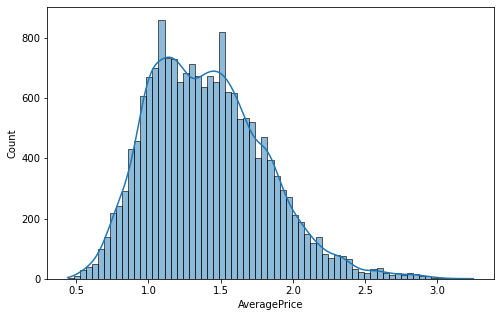

In [29]:
plt.figure(figsize=(8,5))
sns.histplot(df['AveragePrice'],kde=True)

In [30]:
df['AveragePrice'].mean()

1.4059784097758825

**WE can see that the average price of maximum purchased avocado is between 1.0 to 1.6 and the mean of the price to fall within this i.e 1.4059784097758825**
 

<AxesSubplot:xlabel='Total Volume', ylabel='Density'>

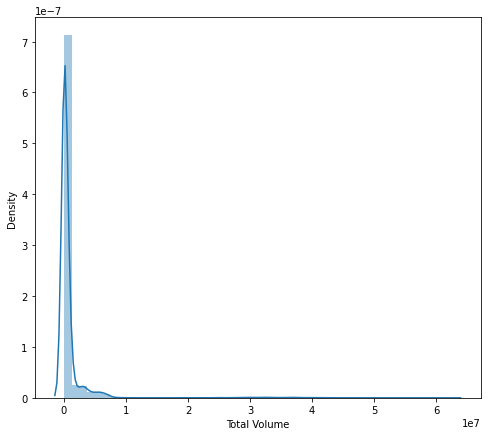

In [31]:
plt.figure(figsize=(8,7))
sns.distplot(df['Total Volume'])

#### This graph is not making any sense in Univariate Analysis,we can just tell that it is left skewed

<AxesSubplot:xlabel='4046', ylabel='Density'>

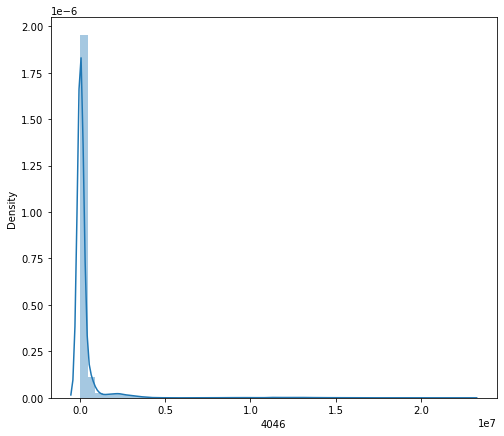

In [32]:
plt.figure(figsize=(8,7))
sns.distplot(df['4046'])

#### This graph is not making any sense in Univariate Analysis,we can just tell that it is left skewed

<AxesSubplot:xlabel='Total Bags', ylabel='Density'>

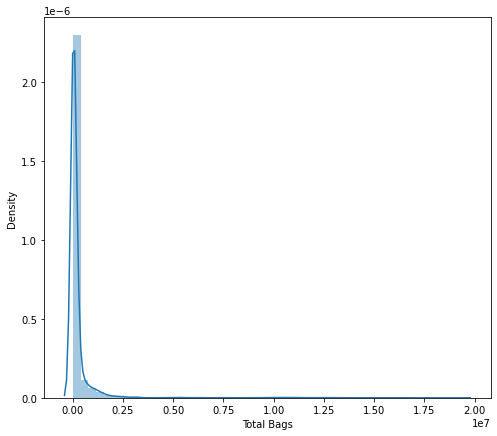

In [33]:
plt.figure(figsize=(8,7))
sns.distplot(df['Total Bags'])

#### This graph is also not making any sense in Univariate Analysis,we can just tell that it is left skewed..

<AxesSubplot:xlabel='type', ylabel='count'>

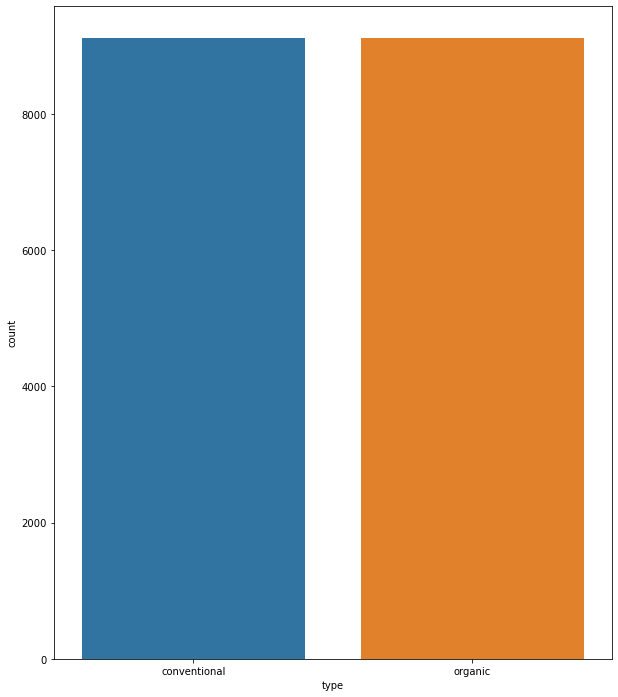

In [34]:
plt.figure(figsize=(10,12))
sns.countplot(df['type'])

#### Types are almost of the same size as show above ,lets check by value count

In [35]:
df['type'].value_counts()

conventional    9126
organic         9123
Name: type, dtype: int64

#### Its Just a difference of 3 units(less) in organic as compared to conventional

## Lets plot all the graphs together any do the Univariate analysis but 1st make list of all the columns which are  numerical..

In [36]:
# Now checking for numerical columns
no_1=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        no_1.append(i)
print(no_1)

['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'year', 'Month', 'Day']


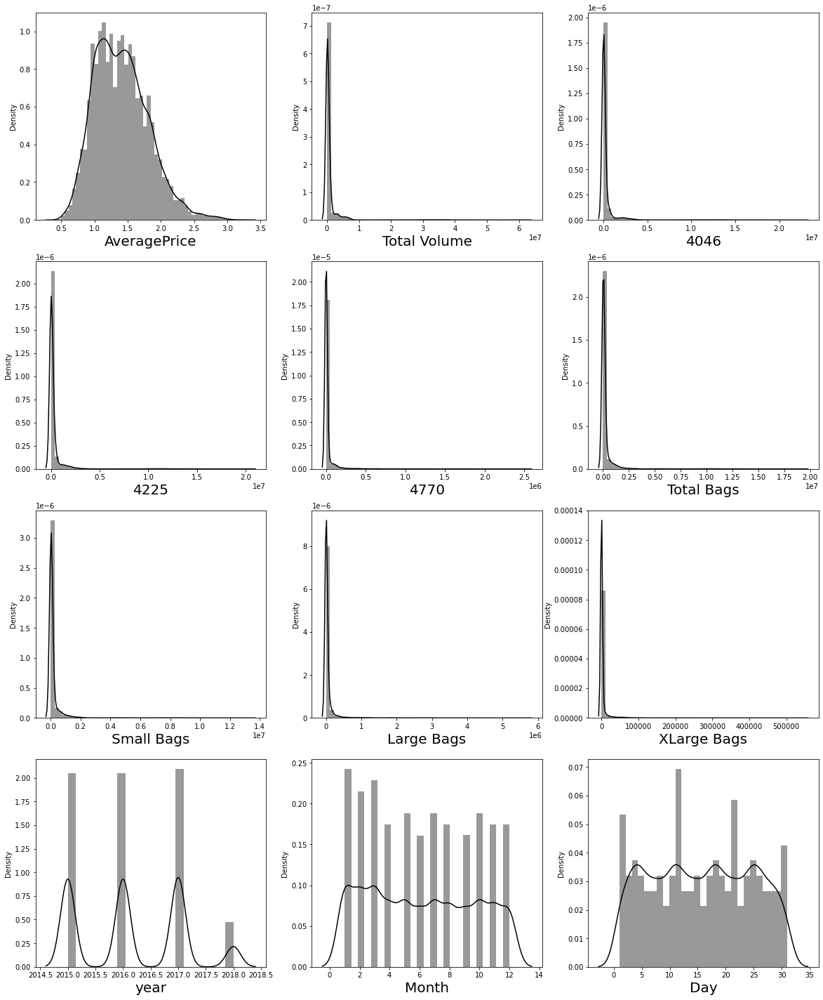

In [37]:
# Checking how the data has been distriubted in each column

plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in no_1:
    if plotnumber<=14:
        ax = plt.subplot(4,3,plotnumber)
        sns.distplot(df[column],color='black')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

**AveragePrice  ,Total Volume	,4046	,4225	,4770	,Total Bags	,Small Bags	,Large Bags	,XLarge Bags**

**All these above columns have skewness and they all are left skewed ↟**

**We can see that in year column the least sales of avocado is in 2018 and 2015,2016 & 2017 have almost same kind of sales**

**In Month jan,Feb and Mar the sale is max, and the least seems to be in august and september** 

<h2 style='text-align:center;font-size:30px;background-color:black;border:30px;color:white'> B. Bivariate Analysis <h2>

In [38]:
df.columns

Index(['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags',
       'Small Bags', 'Large Bags', 'XLarge Bags', 'type', 'year', 'region',
       'Month', 'Day'],
      dtype='object')

<AxesSubplot:xlabel='type', ylabel='AveragePrice'>

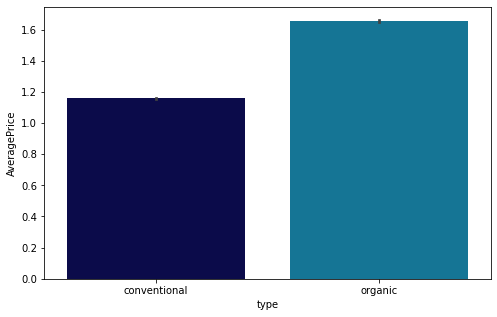

In [39]:
plt.figure(figsize=(8,5))
sns.barplot(x='type',y='AveragePrice',data=df,palette='ocean')

#### Here we can see that the organic products are costlier than conventional product.. We know this well that any product which is organic is much costlier than the product with fertilizers

<AxesSubplot:xlabel='type', ylabel='Total Bags'>

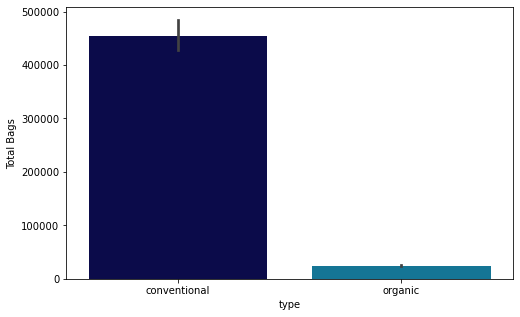

In [40]:
plt.figure(figsize=(8,5))
sns.barplot(x='type',y='Total Bags',data=df,palette='ocean')

#### Here we can see that the coventional avocado is more purchased by the people because the reason organic product is costlier and are not easily available as compared to conventional product

<AxesSubplot:xlabel='year', ylabel='AveragePrice'>

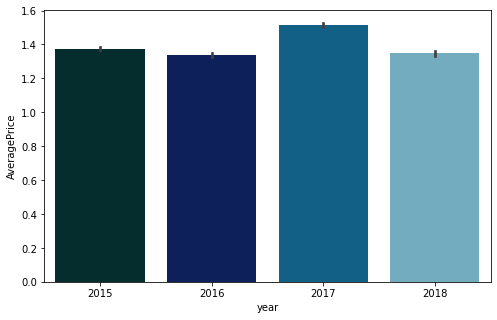

In [41]:
plt.figure(figsize=(8,5))
sns.barplot(x='year',y='AveragePrice',data=df,palette='ocean')

#### The price of Avocado is maximum in 2017 and in 2015,2016 & 2018 are almost same..

<AxesSubplot:xlabel='year', ylabel='Total Bags'>

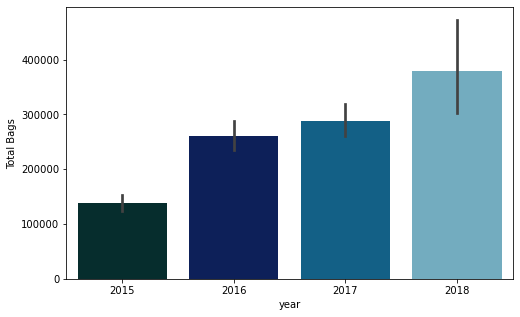

In [42]:
plt.figure(figsize=(8,5))
sns.barplot(x='year',y='Total Bags',data=df,palette='ocean')

#### In 2018 the total numbers of bag sold were maximum.. From 2015 to 2018 we see a positive increase in the Total bags sold

<AxesSubplot:xlabel='year', ylabel='Small Bags'>

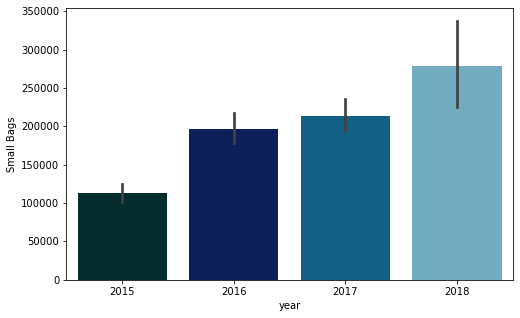

In [43]:
plt.figure(figsize=(8,5))
sns.barplot(x='year',y='Small Bags',data=df,palette='ocean')

#### In 2018 the total numbers of bag sold were maximum.. From 2015 to 2018 we see a positive increase in the Small bags sold

<AxesSubplot:xlabel='year', ylabel='XLarge Bags'>

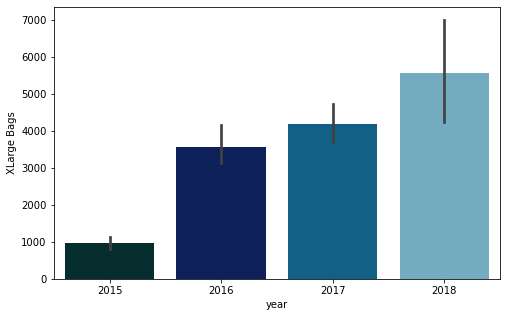

In [44]:
plt.figure(figsize=(8,5))
sns.barplot(x='year',y='XLarge Bags',data=df,palette='ocean')

<AxesSubplot:xlabel='year', ylabel='Large Bags'>

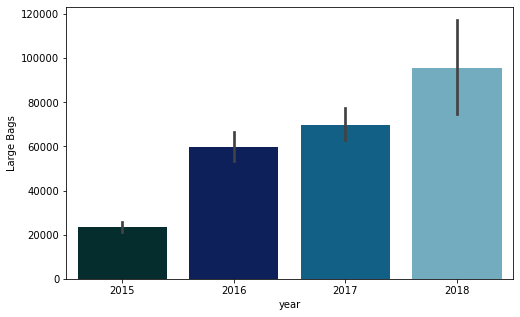

In [45]:
plt.figure(figsize=(8,5))
sns.barplot(x='year',y='Large Bags',data=df,palette='ocean')

### For Above 2 plots :- Its almost the same sales in all types of bags which is in 2018 the total numbers of bag sold were maximum.. From 2015 to 2018 we see a positive increase in the sales of Avocado

<AxesSubplot:xlabel='Month', ylabel='Total Bags'>

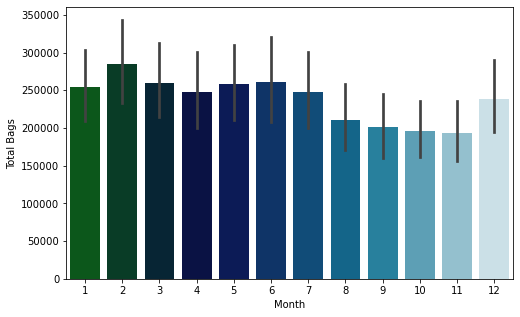

In [46]:
plt.figure(figsize=(8,5))
sns.barplot(x='Month',y='Total Bags',data=df,palette='ocean')

#### In Feb(2) followed by june(6) is the highest sales month while considering total bags ..

<AxesSubplot:xlabel='Month', ylabel='AveragePrice'>

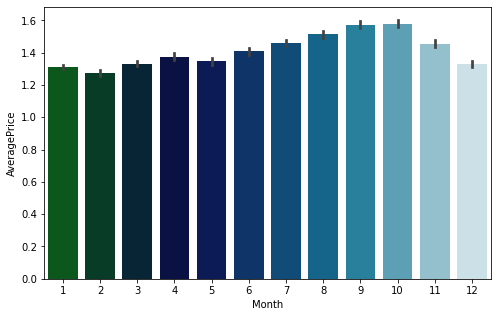

In [47]:
plt.figure(figsize=(8,5))
sns.barplot(x='Month',y='AveragePrice',data=df,palette='ocean')

#### we can make a conclusion from this plot that from june(6) the price kept on increasing till November(11) .. 

Text(0.5, 1.0, 'Average Price of Avocado According to Region')

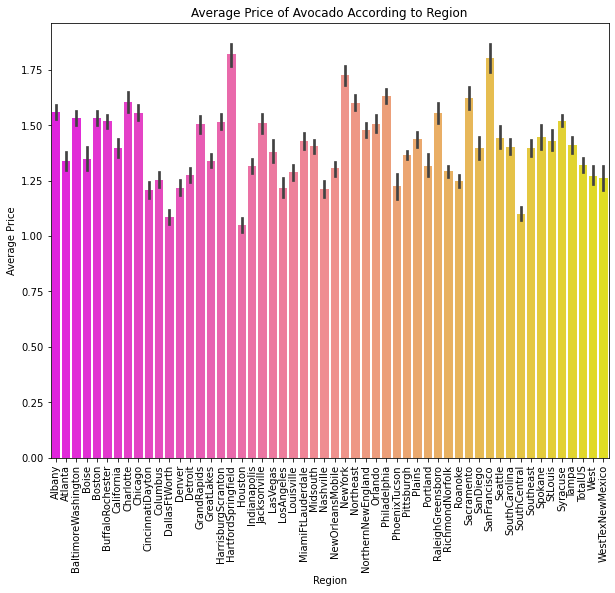

In [48]:
plt.figure(figsize=(10,8))
sns.barplot(x='region',y='AveragePrice',data=df,palette='spring')
plt.xticks(rotation=90)
plt.xlabel('Region')
plt.ylabel('Average Price')
plt.title('Average Price of Avocado According to Region')

#### We can see that these are the region where price is very high

**harrisburgScranton**

**HartfordSpringfield**

   **SanFrancisco**

   **NewYork**
     
   **Philadelphia**

**Sacramento**


Text(0.5, 1.0, 'Total Volume of Avocado in the region')

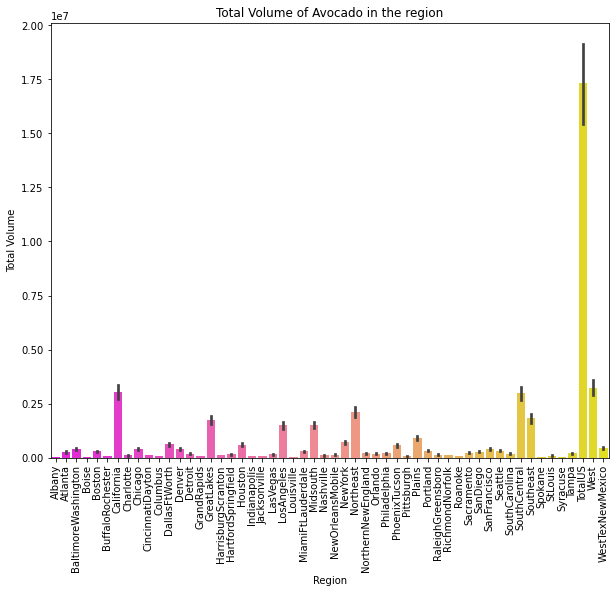

In [49]:
plt.figure(figsize=(10,8))
sns.barplot(x='region',y='Total Volume',data=df,palette='spring')
plt.xticks(rotation=90)
plt.xlabel('Region')
plt.ylabel('Total Volume')
plt.title('Total Volume of Avocado in the region')

#### Apart from TotalUS ,the maximum consumption that we see is in California,South Central,SouthEast,West,NorthEast and Great Lakes

<AxesSubplot:xlabel='type', ylabel='Total Volume'>

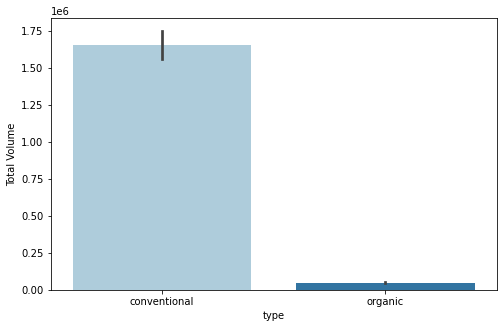

In [50]:
plt.figure(figsize=(8,5))
sns.barplot(x='type',y='Total Volume',data=df,palette='Paired')

#### In total volume the max volumne comprises of coventional avocado and organic is very less

<h2 style='text-align:center;font-size:30px;background-color:black;border:30px;color:white'> C. Multivariate Analysis <h2>

In [51]:
df.columns

Index(['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags',
       'Small Bags', 'Large Bags', 'XLarge Bags', 'type', 'year', 'region',
       'Month', 'Day'],
      dtype='object')

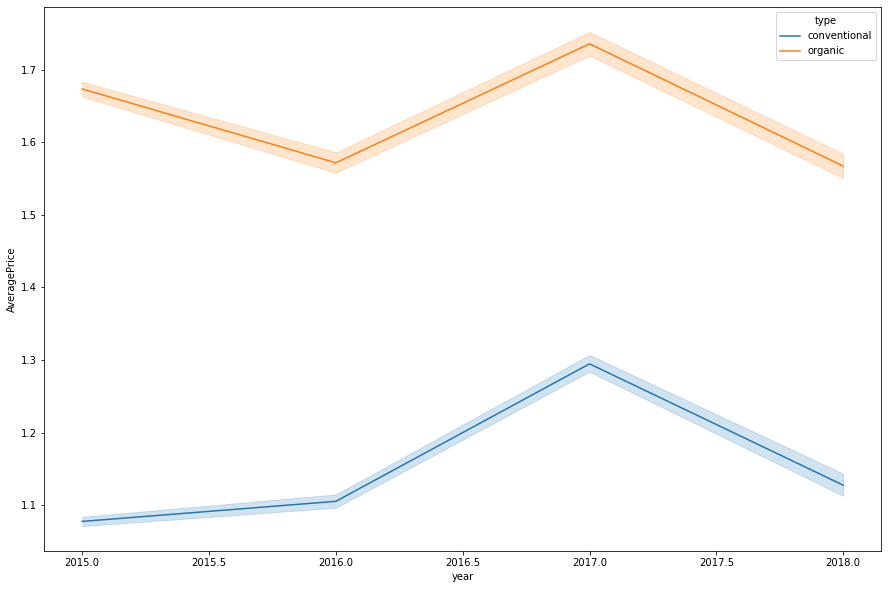

In [52]:
plt.figure(figsize=(15,10))
sns.lineplot(x="year", y="AveragePrice", hue='type', data=df)
plt.show()

#### We can see that from 2016 to 2017 there is a postive growth or sales in both coventional and organic and in 2017 the sales is at a peak of both the types but here in coventional we can see that too that there is steady growth 2015 to 2016 also so we can say that conventional avocado growth is more than Organic ... Here the orange line is of Organic and we can see that its price is higher than conventional avocado

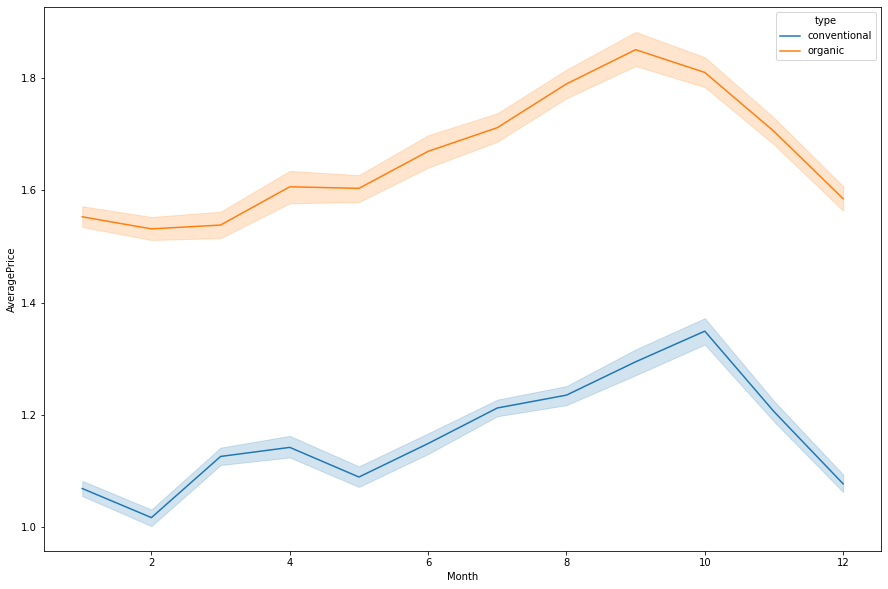

In [53]:
plt.figure(figsize=(15,10))
sns.lineplot(x="Month", y="AveragePrice", hue='type', data=df)
plt.show()

### There was a hike between months 6 – 10 for both Conventional and Organic type of Avocados prices

In [54]:
df.columns

Index(['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags',
       'Small Bags', 'Large Bags', 'XLarge Bags', 'type', 'year', 'region',
       'Month', 'Day'],
      dtype='object')

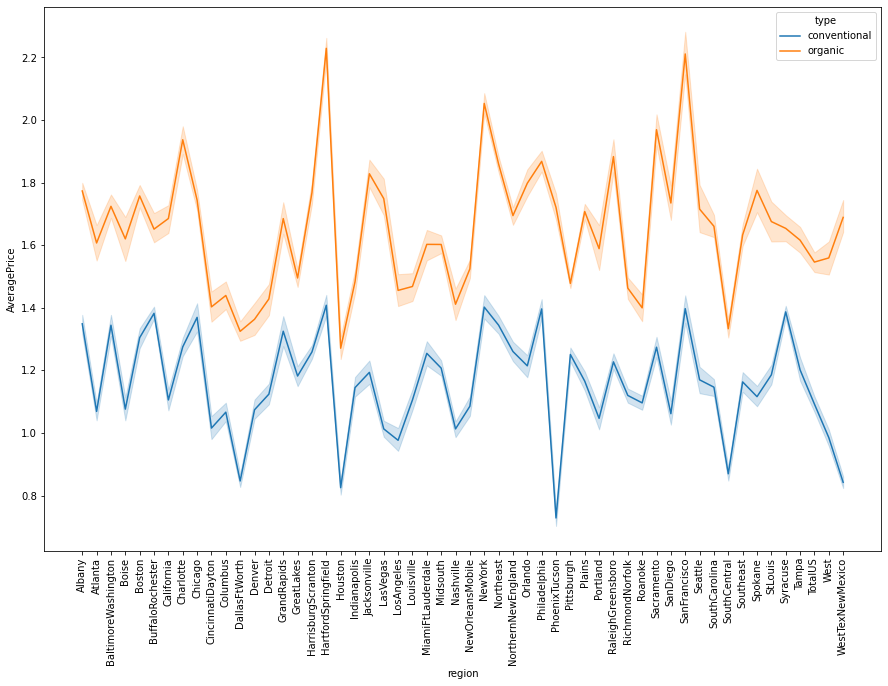

In [55]:
plt.figure(figsize=(15,10))
sns.lineplot(x="region", y="AveragePrice", hue='type', data=df)
plt.xticks(rotation=90)
plt.show()

harrisburgScranton

HartfordSpringfield

SanFrancisco

NewYork

Philadelphia

Sacramento

-------------------------------------------------------------------------------------------------------------------

**These are the region which is common for both Coventional and Organic and has the maximum price of the avocados**


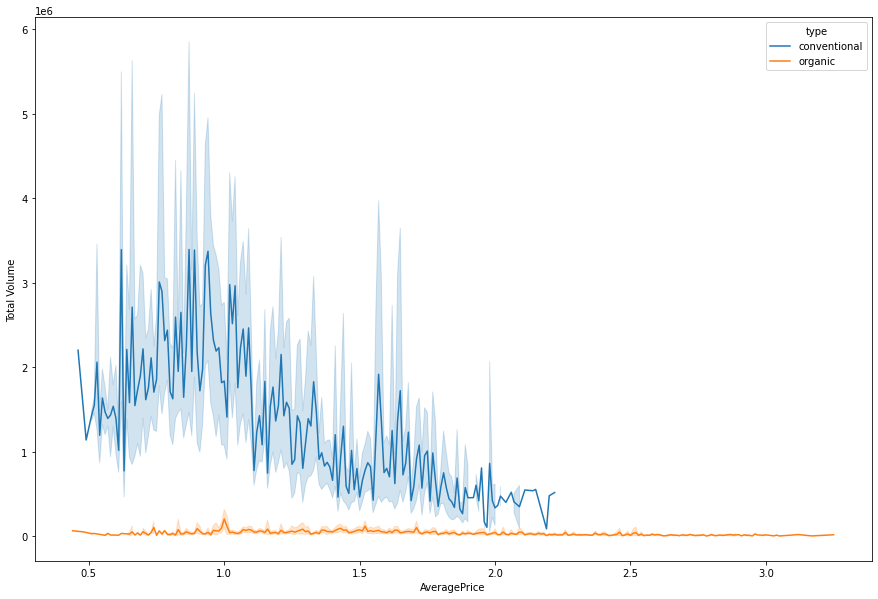

In [56]:
plt.figure(figsize=(15,10))
sns.lineplot(x="AveragePrice", y="Total Volume", hue='type', data=df)
plt.show()

#### Total volume of Conventional Acocado is more as compared to organic But the price of conventional avocado is less as compared to Organic

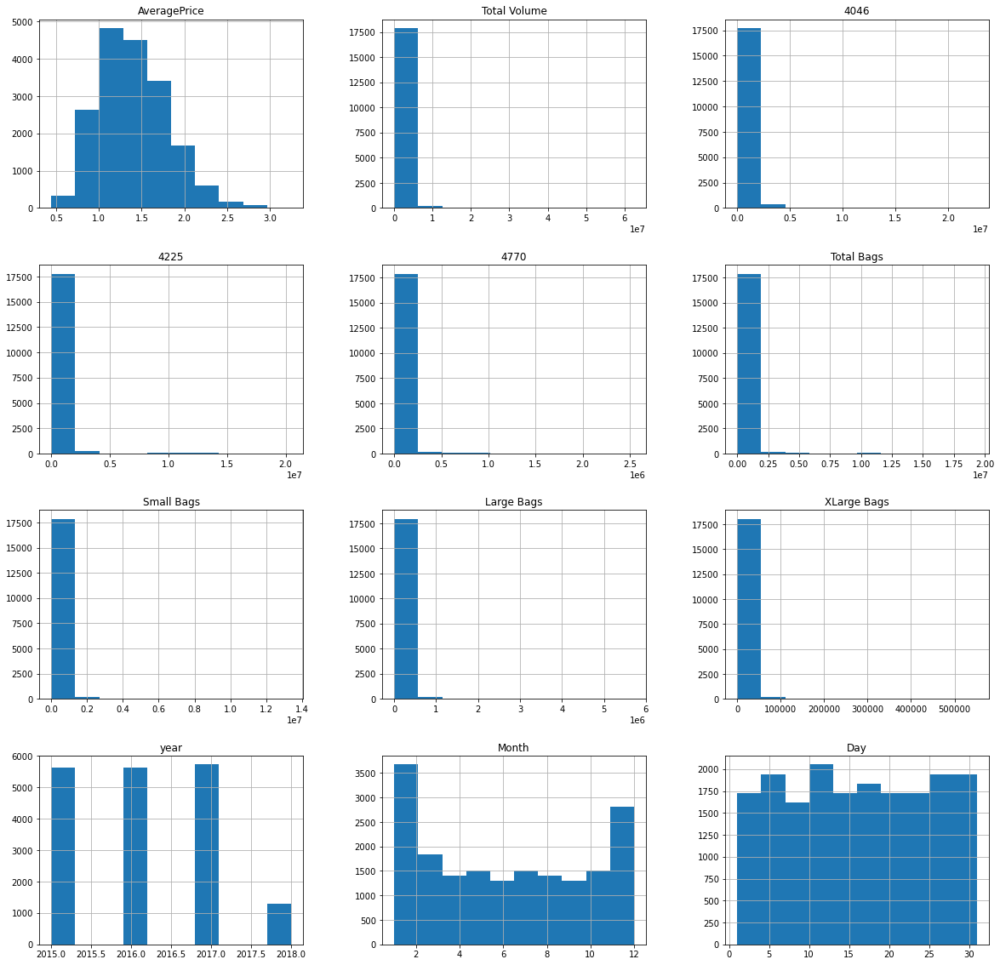

In [57]:
df.hist(bins=10, figsize=(20,20))
plt.show()

### Total Volume', '4046', '4225', '4770', 'Total Bags','Small Bags', 'Large Bags', 'XLarge Bags'

**All the above mentioned columns have skewness we will correct it later**

AveragePrice        AxesSubplot(0.125,0.71587;0.133621x0.16413)
Total Volume     AxesSubplot(0.285345,0.71587;0.133621x0.16413)
4046              AxesSubplot(0.44569,0.71587;0.133621x0.16413)
4225             AxesSubplot(0.606034,0.71587;0.133621x0.16413)
4770             AxesSubplot(0.766379,0.71587;0.133621x0.16413)
Total Bags         AxesSubplot(0.125,0.518913;0.133621x0.16413)
Small Bags      AxesSubplot(0.285345,0.518913;0.133621x0.16413)
Large Bags       AxesSubplot(0.44569,0.518913;0.133621x0.16413)
XLarge Bags     AxesSubplot(0.606034,0.518913;0.133621x0.16413)
year            AxesSubplot(0.766379,0.518913;0.133621x0.16413)
Month              AxesSubplot(0.125,0.321957;0.133621x0.16413)
Day             AxesSubplot(0.285345,0.321957;0.133621x0.16413)
dtype: object

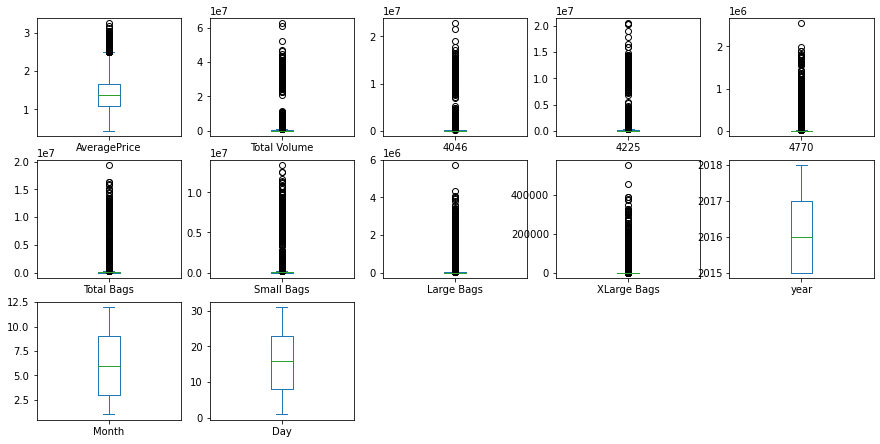

In [58]:
df.plot(kind='box',subplots=True,layout=(4,5),figsize=(15,10))

#### We can that Outliers are present in Average Price,Total Volumne ,4046 ,4225,4770,Total Bags ,Small Bags, large bags,xlarge bags ....WE CAN TO REMOVE THIS OUTLIERS

<h2 style='text-align:center;font-size:40px;background-color:black;border:40px;color:white'> CORRELATION <h2>

In [59]:
df.corr()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Month,Day
AveragePrice,1.000000,-0.192752,-0.208317,-0.172928,-0.179446,-0.177088,-0.174730,-0.172940,-0.117592,0.093197,0.162409,0.027386
Total Volume,-0.192752,1.000000,0.977863,0.974181,0.872202,0.963047,0.967238,0.880640,0.747157,0.017193,-0.024689,-0.009747
4046,-0.208317,0.977863,1.000000,0.926110,0.833389,0.920057,0.925280,0.838645,0.699377,0.003353,-0.025803,-0.010159
4225,-0.172928,0.974181,0.926110,1.000000,0.887855,0.905787,0.916031,0.810015,0.688809,-0.009559,-0.022108,-0.012393
4770,-0.179446,0.872202,0.833389,0.887855,1.000000,0.792314,0.802733,0.698471,0.679861,-0.036531,-0.033424,-0.009009
Total Bags,-0.177088,0.963047,0.920057,0.905787,0.792314,1.000000,0.994335,0.943009,0.804233,0.071552,-0.022724,-0.004988
Small Bags,-0.174730,0.967238,0.925280,0.916031,0.802733,0.994335,1.000000,0.902589,0.806845,0.063915,-0.023126,-0.003870
Large Bags,-0.172940,0.880640,0.838645,0.810015,0.698471,0.943009,0.902589,1.000000,0.710858,0.087891,-0.020187,-0.008352
XLarge Bags,-0.117592,0.747157,0.699377,0.688809,0.679861,0.804233,0.806845,0.710858,1.000000,0.081033,-0.012969,0.000319
year,0.093197,0.017193,0.003353,-0.009559,-0.036531,0.071552,0.063915,0.087891,0.081033,1.000000,-0.177050,0.004475


In [60]:
df.corr()['AveragePrice'].sort_values()

4046           -0.208317
Total Volume   -0.192752
4770           -0.179446
Total Bags     -0.177088
Small Bags     -0.174730
Large Bags     -0.172940
4225           -0.172928
XLarge Bags    -0.117592
Day             0.027386
year            0.093197
Month           0.162409
AveragePrice    1.000000
Name: AveragePrice, dtype: float64

#### We can see that there are many columns which are negatively correlated to target variable 
**4046 , Total Volume ,4770 ,Total Bags ,Small Bags ,Large Bags ,4225 ,XLarge Bags are the columns which are Negatively correlated**

<AxesSubplot:>

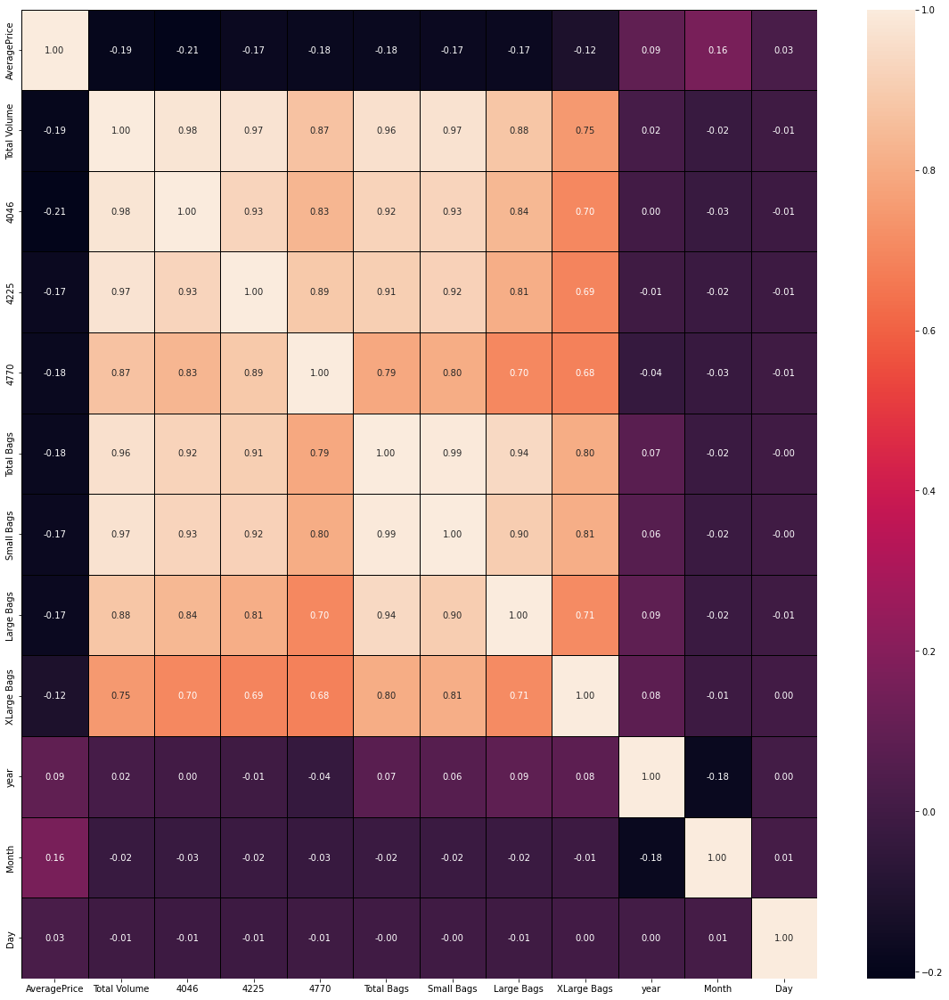

In [61]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),annot=True,linewidths=0.5,linecolor='black',fmt='.2f')


#### Negetively correlated columns

4046           -0.21%

Total Volume   -0.19%

4770           -0.18%

Total Bags     -0.18%

Small Bags     -0.17%

Large Bags     -0.17%

4225           -0.17%

XLarge Bags    -0.12%

**These are the columns which are Negetively correlated to target variable ..**

----------------------------------------------------------------------------------

**Positively correlated columns**


Day             0.03%

year            0.09%

Month           0.16%

**These are the columns which are Positively correlated to target variable ..**

---------------------------------------------------------------------------------


**The least correlated column is :- XLarge Bags    -0.12%**

**The Max correlated column is :-   Month       0.16%**

-----------------------------------------------------------------------------------

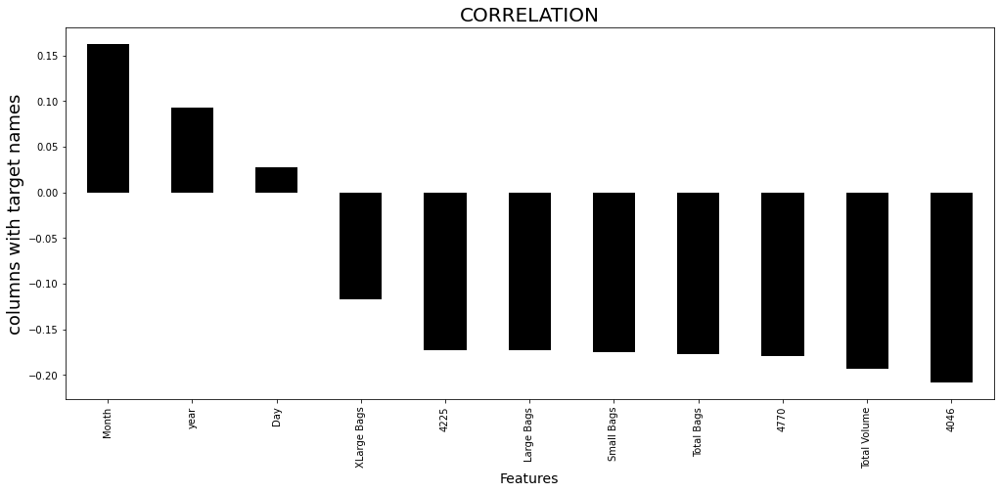

In [62]:
#checking the columns which are positively and negatively correlated

plt.figure(figsize=(17,7))
df.corr()['AveragePrice'].sort_values(ascending=False).drop(['AveragePrice']).plot(kind='bar',color='black')
plt.xlabel('Features',fontsize=14)
plt.ylabel('columns with target names',fontsize=18)
plt.title('CORRELATION',fontsize=20)
plt.show()

#### We can see that only 3 columns are positive correlated columns 

**And Rest all the columns are Negative correlated columns**

#### Upwards (positive)

Day 0.03%

year 0.09%

Month 0.16%

**Downwards(Negative)**

4046 -0.21%

Total Volume -0.19%

4770 -0.18%

Total Bags -0.18%

Small Bags -0.17%

Large Bags -0.17%

4225 -0.17%

XLarge Bags -0.12%

<h2 style='text-align:center;font-size:40px;background-color:black;border:40px;color:white'> DESCRIPTIVE STATISTICS <h2>

In [63]:
df.describe()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Month,Day
count,18249.000000,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,18249.000000,18249.000000,18249.000000,18249.000000
mean,1.405978,8.506440e+05,2.930084e+05,2.951546e+05,2.283974e+04,2.396392e+05,1.821947e+05,5.433809e+04,3106.426507,2016.147899,6.177215,15.662612
std,0.402677,3.453545e+06,1.264989e+06,1.204120e+06,1.074641e+05,9.862424e+05,7.461785e+05,2.439660e+05,17692.894652,0.939938,3.534130,8.776281
min,0.440000,8.456000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,2015.000000,1.000000,1.000000
25%,1.100000,1.083858e+04,8.540700e+02,3.008780e+03,0.000000e+00,5.088640e+03,2.849420e+03,1.274700e+02,0.000000,2015.000000,3.000000,8.000000
50%,1.370000,1.073768e+05,8.645300e+03,2.906102e+04,1.849900e+02,3.974383e+04,2.636282e+04,2.647710e+03,0.000000,2016.000000,6.000000,16.000000
75%,1.660000,4.329623e+05,1.110202e+05,1.502069e+05,6.243420e+03,1.107834e+05,8.333767e+04,2.202925e+04,132.500000,2017.000000,9.000000,23.000000
max,3.250000,6.250565e+07,2.274362e+07,2.047057e+07,2.546439e+06,1.937313e+07,1.338459e+07,5.719097e+06,551693.650000,2018.000000,12.000000,31.000000


#### We can see all columns having count 18249. Looks like it doesn't contain missing values..

<AxesSubplot:>

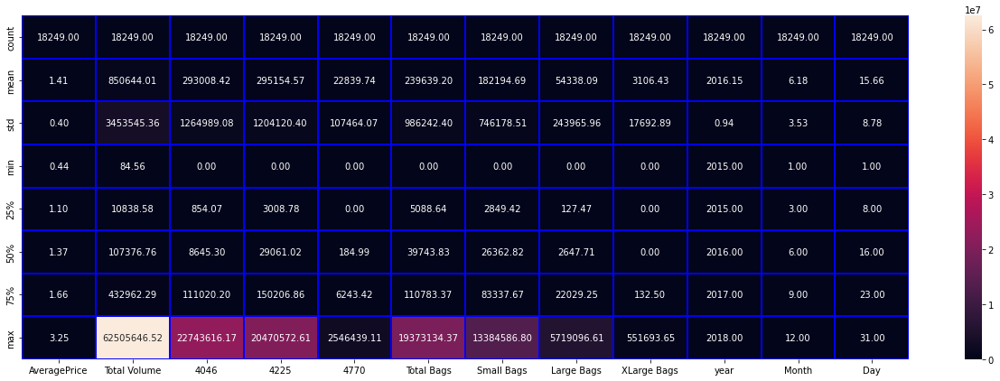

In [64]:
plt.figure(figsize=(22,7))
sns.heatmap(df.describe(),annot=True,linewidths=0.2,linecolor="blue",fmt="0.2f")

#### Outcome of describe() of dataset :-
**from the above plotting we are determining mean,standard deviation,minimum and maximum value of each column**

**Total number rows and column in dataset:-**

**Rows :- 18249**

**columns :- 14**


#### Lets do pandas profiling

In [65]:
df.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,27
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,20
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,13
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,6
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,29


In [66]:

profile = pandas_profiling.ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**It gives  the basic report on the dataframe**

**We have different section where we can find out mant thing relevent**

**Lets know about what pandas profiling Report shows?**

**Ans:-**

**Overview :- Here we have the Overview of the whole dataset**

**Variable :- Here we can get the overview of every column in the dataset.It will show Missing Values,Mean,Minimum,Maximum,Zeros and Memory size of every columns.**

**Correlation:- Here we can see correlations of different types such as Spearman's,Pearson's r,etc of the dataset**

**Samples:- It will take 2 sample data's of 10 rows each..It will be 1st 10 rows and last 10 rows of the dataset**

**Alerts :-Here we see the Alert for the columns which are having High correlation,High cardinality,Zeros,etc in the dataset**


<h2 style='text-align:center;font-size:40px;background-color:black;border:40px;color:white'> Now lets Check Outliers in the dataset <h2>

In [67]:
df.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,27
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,20
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,13
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,6
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,29


In [68]:
df.shape

(18249, 14)

AveragePrice       AxesSubplot(0.125,0.536818;0.0945122x0.343182)
Total Volume    AxesSubplot(0.238415,0.536818;0.0945122x0.343182)
4046            AxesSubplot(0.351829,0.536818;0.0945122x0.343182)
4225            AxesSubplot(0.465244,0.536818;0.0945122x0.343182)
4770            AxesSubplot(0.578659,0.536818;0.0945122x0.343182)
Total Bags      AxesSubplot(0.692073,0.536818;0.0945122x0.343182)
Small Bags      AxesSubplot(0.805488,0.536818;0.0945122x0.343182)
Large Bags            AxesSubplot(0.125,0.125;0.0945122x0.343182)
XLarge Bags        AxesSubplot(0.238415,0.125;0.0945122x0.343182)
year               AxesSubplot(0.351829,0.125;0.0945122x0.343182)
Month              AxesSubplot(0.465244,0.125;0.0945122x0.343182)
Day                AxesSubplot(0.578659,0.125;0.0945122x0.343182)
dtype: object

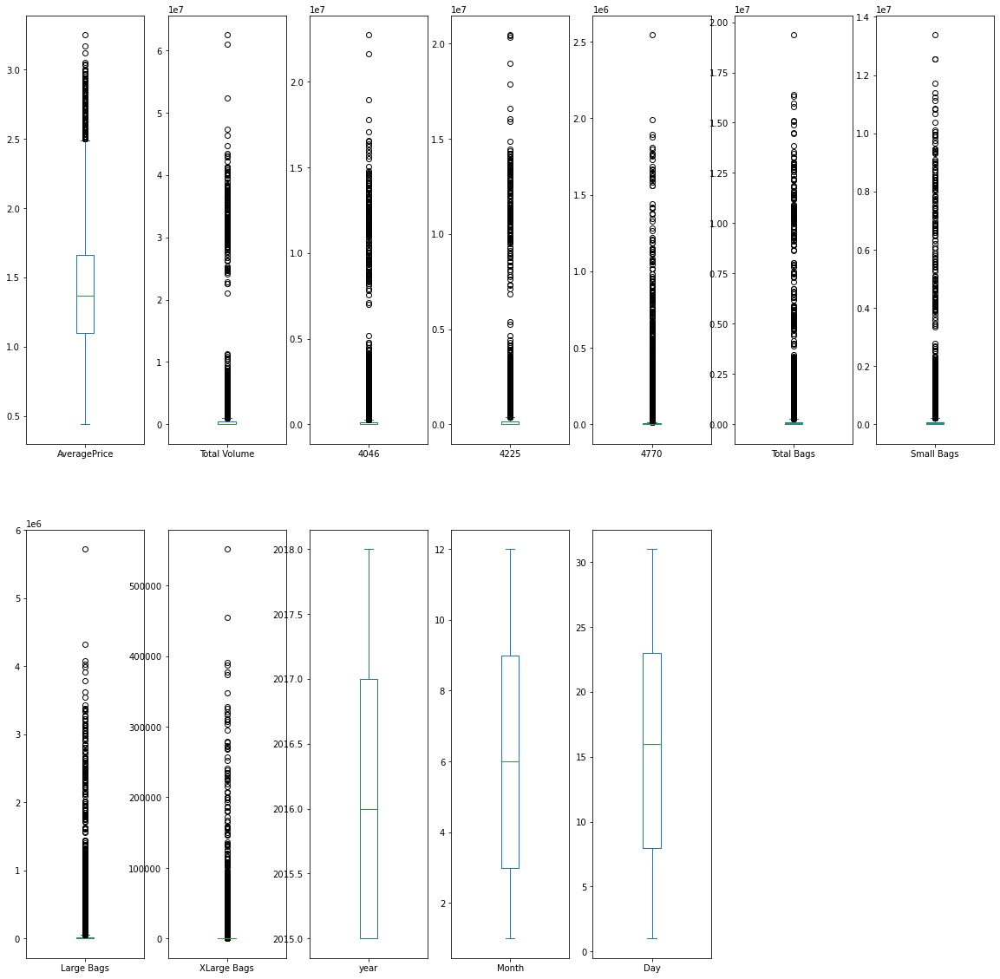

In [69]:
df.plot(kind='box',subplots=True,layout=(2,7),figsize=(20,20))

# Now lets subplot all the columns in the dataset by using Boxplot

#### We can that Outliers are present in Average Price,Total Volumne ,4046 ,4225,4770,Total Bags ,Small Bags, large bags,xlarge bags ....WE CAN TO REMOVE THIS OUTLIERS

<h2 style='text-align:center;font-size:30px;background-color:Black;border:30px;color:white'> Now Lets Delete the columns which are Negatively corrlated to target variable <h2>

In [70]:
df.corr()['AveragePrice'].sort_values()

4046           -0.208317
Total Volume   -0.192752
4770           -0.179446
Total Bags     -0.177088
Small Bags     -0.174730
Large Bags     -0.172940
4225           -0.172928
XLarge Bags    -0.117592
Day             0.027386
year            0.093197
Month           0.162409
AveragePrice    1.000000
Name: AveragePrice, dtype: float64

#### I find there are lot of Negatively correlated columns in the dataset ,but Every columns seems to be important in the dataset So we will not remove columns

<h2 style='text-align:center;font-size:30px;background-color:Black;border:30px;color:white'> Check Skewness <h2>


In [71]:
df.skew()

AveragePrice     0.580303
Total Volume     9.007687
4046             8.648220
4225             8.942466
4770            10.159396
Total Bags       9.756072
Small Bags       9.540660
Large Bags       9.796455
XLarge Bags     13.139751
year             0.215339
Month            0.106617
Day              0.014310
dtype: float64

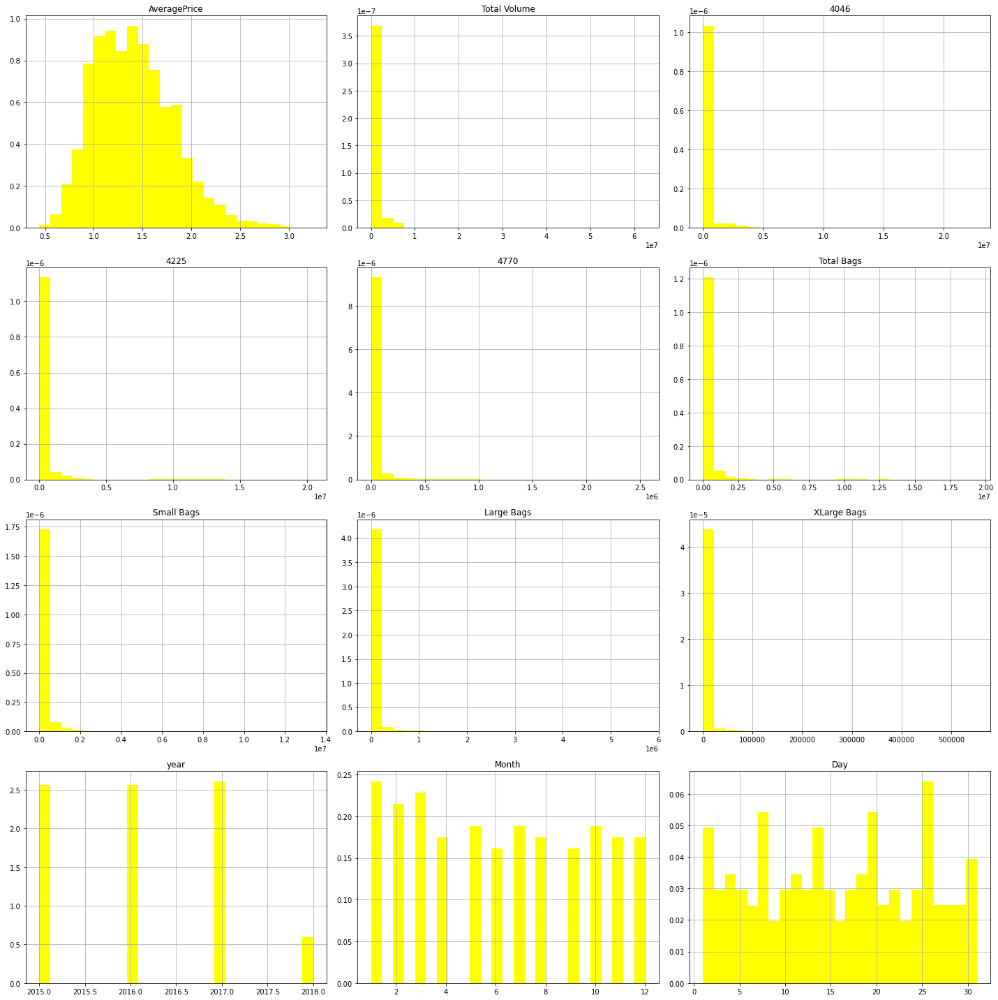

In [72]:
#Lets plot all using Histogram and see the skewness again
 
plt.rcParams['figure.figsize']=(20,20)
df.hist(bins=25,color='yellow',density=True,label='Value',histtype='bar')
plt.tight_layout()
plt.show()

#### AveragePrice ,Total Volume ,4046,4225,4770 ,Total Bags,Small Bags,Large Bags, XLarge Bags     are skewed columns and they all Left skewed


<h2 style='text-align:center;font-size:30px;background-color:Black;border:30px;color:white'> *Now Before Treating Outliers Convert catagorical columns into int format* <h2>

In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   AveragePrice  18249 non-null  float64
 1   Total Volume  18249 non-null  float64
 2   4046          18249 non-null  float64
 3   4225          18249 non-null  float64
 4   4770          18249 non-null  float64
 5   Total Bags    18249 non-null  float64
 6   Small Bags    18249 non-null  float64
 7   Large Bags    18249 non-null  float64
 8   XLarge Bags   18249 non-null  float64
 9   type          18249 non-null  object 
 10  year          18249 non-null  int64  
 11  region        18249 non-null  object 
 12  Month         18249 non-null  int64  
 13  Day           18249 non-null  int64  
dtypes: float64(9), int64(3), object(2)
memory usage: 1.9+ MB


In [74]:
from sklearn.preprocessing import LabelEncoder


In [75]:
#Lets convert all catagorical columns to Int format

le = LabelEncoder()
Input = ['type','region']

for i in Input:
    df[i] = le.fit_transform(df[i])
    

In [76]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   AveragePrice  18249 non-null  float64
 1   Total Volume  18249 non-null  float64
 2   4046          18249 non-null  float64
 3   4225          18249 non-null  float64
 4   4770          18249 non-null  float64
 5   Total Bags    18249 non-null  float64
 6   Small Bags    18249 non-null  float64
 7   Large Bags    18249 non-null  float64
 8   XLarge Bags   18249 non-null  float64
 9   type          18249 non-null  int32  
 10  year          18249 non-null  int64  
 11  region        18249 non-null  int32  
 12  Month         18249 non-null  int64  
 13  Day           18249 non-null  int64  
dtypes: float64(9), int32(2), int64(3)
memory usage: 1.8 MB


In [77]:
df.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,0,2015,0,12,27
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,0,2015,0,12,20
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,0,2015,0,12,13
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,0,2015,0,12,6
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,0,2015,0,11,29


<h2 style='text-align:center;font-size:30px;background-color:Black;border:30px;color:white'> *Now Lets Remove Outliers Now* <h2>

## 1. ZSCORE Method

In [78]:
df.shape

(18249, 14)

In [79]:
from scipy.stats import zscore
z=np.abs(zscore(df))
threshold=3
np.where(z>3)

(array([  346,   359,   780, ..., 17304, 17402, 17428], dtype=int64),
 array([2, 2, 8, ..., 0, 0, 0], dtype=int64))

In [80]:
df_new=df[(z<3).all(axis=1)]

In [81]:
df_new.shape

(17651, 14)

In [82]:
# Percentage of data loss

DataLoss=((18249-17651)/18249)*100
DataLoss

3.276891884486821

#### 3.276891884486821% of data was removed while removing Outliers by ZSCORE METHOD


## 2. IQR (Inter Quantile Range) method

In [83]:
#1st quantile
Q1=df.quantile(0.25)

# 3rd quantile
Q3=df.quantile(0.75)

#IQR
IQR=Q3 - Q1
qq=df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [84]:
print("Old DataFrame data in Rows and Column:",df.shape)
print("\nNew DataFrame data in Rows and Column:",qq.shape)
print("\nTotal Dropped rows:",df.shape[0]-qq.shape[0])

Old DataFrame data in Rows and Column: (18249, 14)

New DataFrame data in Rows and Column: (11538, 14)

Total Dropped rows: 6711


In [85]:
#Percentage Data Loss using IQR
data_loss1 = (18249-11538)/18249*100
data_loss1

36.774617787276014

#### 36.774617787276014% of data was removed while removing Outliers by IQR METHOD


#### Hence, it is not appropriate to consider IQR MEthod for removing Outlier and we will go by ZSCORE Method

<h2 style='text-align:center;font-size:30px;background-color:Black;border:30px;color:white'> *Now Lets Remove Skewness Now* <h2>

In [86]:
df.skew()

AveragePrice     0.580303
Total Volume     9.007687
4046             8.648220
4225             8.942466
4770            10.159396
Total Bags       9.756072
Small Bags       9.540660
Large Bags       9.796455
XLarge Bags     13.139751
type             0.000329
year             0.215339
region           0.000030
Month            0.106617
Day              0.014310
dtype: float64

#### AveragePrice ,Total Volume ,4046,4225,4770 ,Total Bags,Small Bags,Large Bags, XLarge Bags are skewed columns and they all Left skewed

In [87]:
# Columns having skewness 

L1=["AveragePrice","Total Volume","4046","4225","4770","Total Bags","Small Bags","Large Bags","XLarge Bags"]

In [88]:
# Lets remove the skewness from given columns by Power Transform Method

from sklearn.preprocessing import PowerTransformer
PT = PowerTransformer(method='yeo-johnson')

In [89]:
#Removing skewness using yeo-johnson
df_new[["AveragePrice","Total Volume","4046","4225","4770","Total Bags","Small Bags","Large Bags","XLarge Bags"]] = PT.fit_transform(df_new[["AveragePrice","Total Volume","4046","4225","4770","Total Bags","Small Bags","Large Bags","XLarge Bags"]].values)

In [90]:
#Checking skewness after removing skewness by power transform
df_new.skew()

AveragePrice    0.000464
Total Volume   -0.008642
4046           -0.039282
4225           -0.044675
4770            0.024168
Total Bags     -0.022204
Small Bags     -0.024405
Large Bags     -0.110913
XLarge Bags     0.853758
type           -0.037741
year            0.229976
region          0.012798
Month           0.107408
Day             0.011778
dtype: float64

#### We can see that the skewness has been removed from the given columns "AveragePrice","Total Volume","4046","4225","4770","Total Bags","Small Bags","Large Bags","XLarge Bags"..

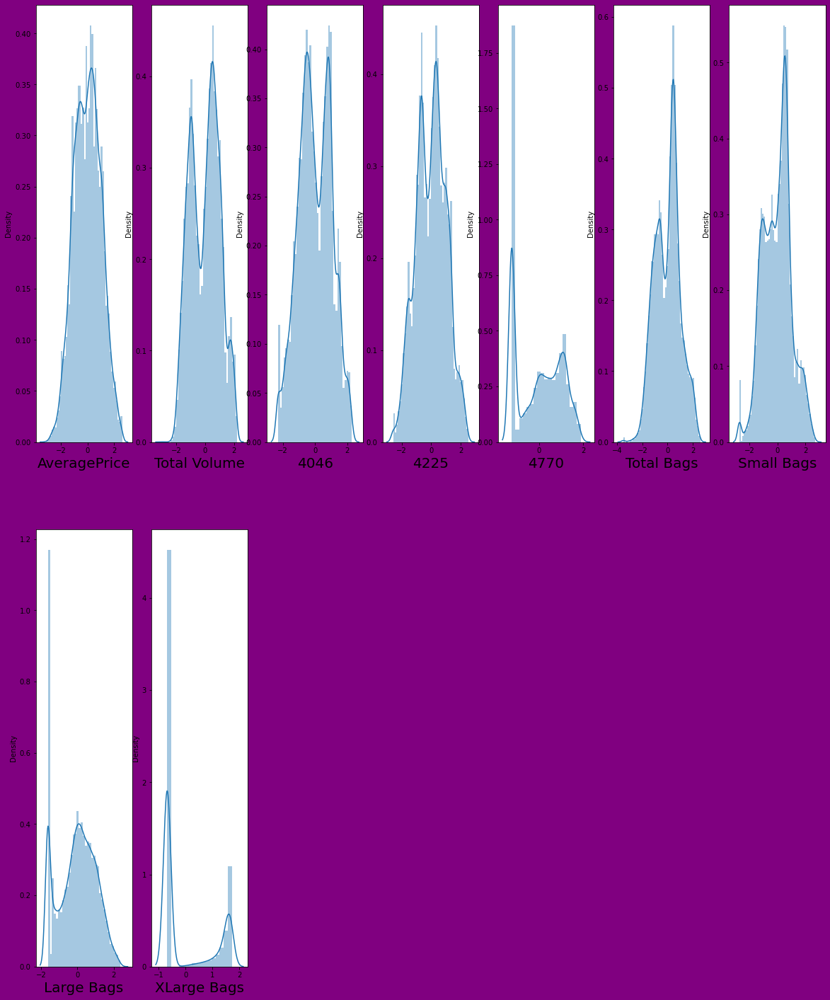

In [91]:
#After removing let's check how the data has been distributed in each column of skew_features.

plt.figure(figsize=(20,25), facecolor='purple')
plotnumber = 1

for column in df_new[L1]:
    if plotnumber<=9:
        ax = plt.subplot(2,7,plotnumber)
        sns.distplot(df_new[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

#### Now all the columns which we skewed has been normalized now

<h2 style='text-align:center;font-size:30px;background-color:Black;border:30px;color:white'> *Now Lets Split the dataset into dependent and independent variable* <h2>

In [92]:
df_new.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,-0.117824,-0.075324,-0.657421,0.351430,-0.222566,-0.537507,-0.347421,-0.781153,-0.677919,0,2015,0,12,27
1,-0.064330,-0.147497,-0.777179,0.269513,-0.175223,-0.498128,-0.311322,-0.771198,-0.677919,0,2015,0,12,20
2,-1.298865,0.205556,-0.731776,0.649333,0.023923,-0.566369,-0.374453,-0.758523,-0.677919,0,2015,0,12,13
3,-0.829026,0.019655,-0.632592,0.468799,-0.121164,-0.713068,-0.510991,-0.699123,-0.677919,0,2015,0,12,6
4,-0.253635,-0.180674,-0.684504,0.262126,-0.110491,-0.686312,-0.490534,-0.607027,-0.677919,0,2015,0,11,29


In [93]:
#Independent Variable
y=df.iloc[:,0]

#Dependent Variable 
x=df.iloc[:,1:]

<h2 style='text-align:center;font-size:30px;background-color:Black;border:30px;color:white'> *Now Lets scale the data using Standard scaler* <h2>

In [94]:
from sklearn.preprocessing import StandardScaler

In [95]:
sc=StandardScaler()

x= pd.DataFrame(sc.fit_transform(x), columns=x.columns)
x

,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,-0.227716,-0.230816,-0.199902,-0.212091,-0.234170,-0.232647,-0.222352,-0.17558,-0.999836,-1.221282,-1.700252,1.647632,1.291857
1,-0.230427,-0.231103,-0.208054,-0.211997,-0.233350,-0.231568,-0.222335,-0.17558,-0.999836,-1.221282,-1.700252,1.647632,0.494231
2,-0.212085,-0.231007,-0.154478,-0.211325,-0.234730,-0.233399,-0.222311,-0.17558,-0.999836,-1.221282,-1.700252,1.647632,-0.303396
3,-0.223444,-0.230741,-0.185350,-0.211864,-0.237096,-0.236568,-0.222186,-0.17558,-0.999836,-1.221282,-1.700252,1.647632,-1.101022
4,-0.231538,-0.230891,-0.208719,-0.211834,-0.236718,-0.236154,-0.221924,-0.17558,-0.999836,-1.221282,-1.700252,1.364669,1.519750
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,-0.241373,-0.230017,-0.243857,-0.212540,-0.229301,-0.226665,-0.220964,-0.17558,1.000164,1.970504,1.700811,-1.181997,-1.328915
18245,-0.242296,-0.230693,-0.242277,-0.212540,-0.233594,-0.232196,-0.221403,-0.17558,1.000164,1.970504,1.700811,-1.464959,1.405803
18246,-0.242331,-0.230693,-0.243090,-0.205766,-0.233463,-0.231644,-0.222561,-0.17558,1.000164,1.970504,1.700811,-1.464959,0.608177
18247,-0.241625,-0.230428,-0.242651,-0.205774,-0.231866,-0.229543,-0.222529,-0.17558,1.000164,1.970504,1.700811,-1.464959,-0.189449


<h2 style='text-align:center;font-size:30px;background-color:Black;border:30px;color:white'> *Now Lets Whether Multicollinearity is present in the dataset or not ?* <h2>

### WE CHECK MULTICOLLINEARITY BY VARIANCE INFLATION FACTOR (VIF)

In [96]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [97]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [98]:
vif_cal()

      VIF FACTOR      FEATURES
0   4.926465e+09  Total Volume
1   6.609602e+08          4046
2   5.988844e+08          4225
3   4.770265e+06          4770
4   2.370316e+14    Total Bags
5   1.364727e+14    Small Bags
6   1.450435e+13    Large Bags
7   7.622368e+10   XLarge Bags
8   1.061752e+00          type
9   1.084444e+00          year
10  1.069500e+00        region
11  1.037268e+00         Month
12  1.000900e+00           Day


#### We can see that Multicollinearity is not present in the dataset

<h2 style='text-align:center;font-size:30px;background-color:Black;border:30px;color:white'> *Now Lets Train and Test the model using Regression Models* <h2>

In [99]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.model_selection import train_test_split

In [100]:
lr=LinearRegression()
for i in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=i)
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    print (f"At random state {i},the training accuracy is :- {r2_score(y_train,pred_train)}")
    print (f"At random state {i},the testing accuracy is :- {r2_score(y_test,pred_test)}")
    print ("\n\n")

At random state 0,the training accuracy is :- 0.43679101988658353
At random state 0,the testing accuracy is :- 0.44757184183137444



At random state 1,the training accuracy is :- 0.43816597803001245
At random state 1,the testing accuracy is :- 0.4427366125931169



At random state 2,the training accuracy is :- 0.4431058894658485
At random state 2,the testing accuracy is :- 0.4223976244248422



At random state 3,the training accuracy is :- 0.43986727830999117
At random state 3,the testing accuracy is :- 0.4357412012593388



At random state 4,the training accuracy is :- 0.4423619715664867
At random state 4,the testing accuracy is :- 0.42574917332171747



At random state 5,the training accuracy is :- 0.43863163721394594
At random state 5,the testing accuracy is :- 0.43983161649929425



At random state 6,the training accuracy is :- 0.43794598984426913
At random state 6,the testing accuracy is :- 0.4434667981779927



At random state 7,the training accuracy is :- 0.4396477203719964
At 

At random state 69,the testing accuracy is :- 0.44657082359235456



At random state 70,the training accuracy is :- 0.4377343940351254
At random state 70,the testing accuracy is :- 0.44404647275522435



At random state 71,the training accuracy is :- 0.43661632806749184
At random state 71,the testing accuracy is :- 0.44864228005753315



At random state 72,the training accuracy is :- 0.441974512904296
At random state 72,the testing accuracy is :- 0.42719692944579446



At random state 73,the training accuracy is :- 0.43860707327974624
At random state 73,the testing accuracy is :- 0.4407974294316441



At random state 74,the training accuracy is :- 0.4375772196152804
At random state 74,the testing accuracy is :- 0.44510547197538863



At random state 75,the training accuracy is :- 0.44324231670268954
At random state 75,the testing accuracy is :- 0.42249648970802767



At random state 76,the training accuracy is :- 0.43599673078037693
At random state 76,the testing accuracy is :- 0.45107

#### We are taking 98 as a random state bcz here the difference between training and testing is not much

In [101]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=98)

In [102]:
lr.fit(x_train,y_train)

LinearRegression()

In [103]:
pred_test=lr.predict(x_test)

In [104]:
print (r2_score(y_test,pred_test))

# r2_score is 44%

0.4410444801717148


#### I can see that Linear Regression is not working fine ,its just giving 44% as a r2_score

In [105]:
print (' **ERROR** ')

print ('Mean Absolute Error :->',mean_absolute_error(y_test,pred_test))
print ('Mean Squared Error :->',mean_squared_error(y_test,pred_test))

print ('Root Mean Squared Error :->',np.sqrt(mean_squared_error(y_test,pred_test)))

 **ERROR** 
Mean Absolute Error :-> 0.23194380729782452
Mean Squared Error :-> 0.0908240906981307
Root Mean Squared Error :-> 0.30137035471016504


## Lets do CROSS VALIDATION of Linear Regression model

In [106]:
Train_accuracy=r2_score(y_train,pred_train)
Test_accuracy=r2_score(y_test,pred_test)

from sklearn.model_selection import cross_val_score

for i in range(2,16):
    cv_score=cross_val_score(lr,x,y,cv=i)
    cv_mean=cv_score.mean()
    print (f"At cross fold {i} the cv score is {cv_mean} and accuracy score for training is {Train_accuracy} and accuracy for testing is {Test_accuracy}")
    print ("\n\n")

At cross fold 2 the cv score is -5416.937075404716 and accuracy score for training is -0.456301030324336 and accuracy for testing is 0.4410444801717148



At cross fold 3 the cv score is -13.250639620772672 and accuracy score for training is -0.456301030324336 and accuracy for testing is 0.4410444801717148



At cross fold 4 the cv score is -12.353807249060454 and accuracy score for training is -0.456301030324336 and accuracy for testing is 0.4410444801717148



At cross fold 5 the cv score is -10.886791742580849 and accuracy score for training is -0.456301030324336 and accuracy for testing is 0.4410444801717148



At cross fold 6 the cv score is -1.0152112847747645 and accuracy score for training is -0.456301030324336 and accuracy for testing is 0.4410444801717148



At cross fold 7 the cv score is 0.027062684181694996 and accuracy score for training is -0.456301030324336 and accuracy for testing is 0.4410444801717148



At cross fold 8 the cv score is -0.040882295437364144 and accura

#### CV is even not performing good ,so i am taking cv =9 ,bcz this is the closest to r2_Score 

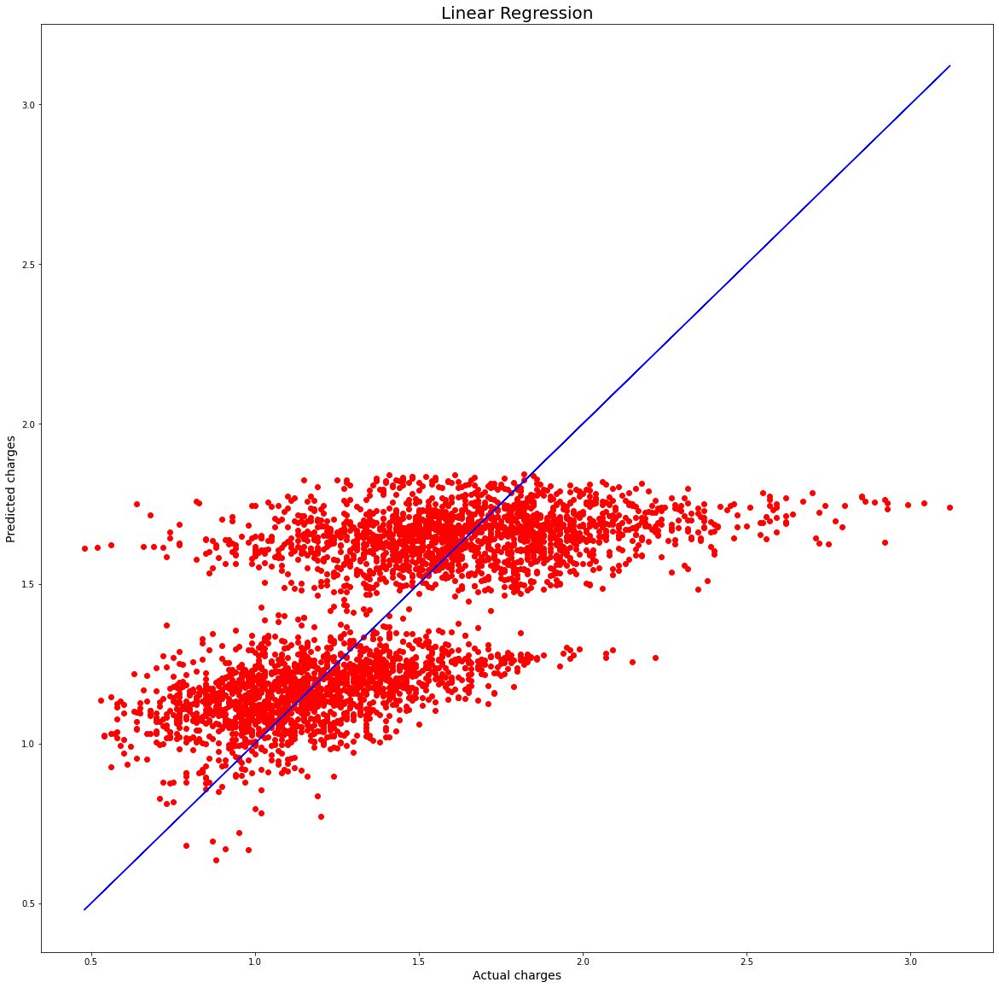

In [107]:
import matplotlib.pyplot as plt
plt.scatter (x=y_test,y=pred_test,color='r')

plt.plot(y_test,y_test,color='b')

plt.xlabel('Actual charges' ,fontsize=14)

plt.ylabel('Predicted charges', fontsize=14)
plt.title('Linear Regression' , fontsize=20)
plt. show()

#### Here we can see that the Model is not learning well and it is highly biased ,underfitting problem is present in Linear Regression ,we will later correct it with Lasso and Ridge

# Lets Train with Another Regressor Model

## DecisionTreeRegressor

In [108]:
from sklearn.tree import DecisionTreeRegressor
dt=DecisionTreeRegressor()

In [109]:
for i in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=i)
    dt.fit(x_train,y_train)
    pred_train=dt.predict(x_train)
    pred_test=dt.predict(x_test)
    print (f"At random state {i},the training accuracy is :- {r2_score(y_train,pred_train)}")
    print (f"At random state {i},the testing accuracy is :- {r2_score(y_test,pred_test)}")
    print ("\n\n")

At random state 0,the training accuracy is :- 1.0
At random state 0,the testing accuracy is :- 0.7644914515698434



At random state 1,the training accuracy is :- 1.0
At random state 1,the testing accuracy is :- 0.771127626663571



At random state 2,the training accuracy is :- 1.0
At random state 2,the testing accuracy is :- 0.7558981546818144



At random state 3,the training accuracy is :- 1.0
At random state 3,the testing accuracy is :- 0.7759183072835247



At random state 4,the training accuracy is :- 1.0
At random state 4,the testing accuracy is :- 0.7522773398754206



At random state 5,the training accuracy is :- 1.0
At random state 5,the testing accuracy is :- 0.7299093350638552



At random state 6,the training accuracy is :- 1.0
At random state 6,the testing accuracy is :- 0.7795515912938178



At random state 7,the training accuracy is :- 1.0
At random state 7,the testing accuracy is :- 0.7731189575356129



At random state 8,the training accuracy is :- 1.0
At random state

At random state 69,the testing accuracy is :- 0.7425567770756768



At random state 70,the training accuracy is :- 1.0
At random state 70,the testing accuracy is :- 0.7551752509653902



At random state 71,the training accuracy is :- 1.0
At random state 71,the testing accuracy is :- 0.7418749551031061



At random state 72,the training accuracy is :- 1.0
At random state 72,the testing accuracy is :- 0.7523395110769887



At random state 73,the training accuracy is :- 1.0
At random state 73,the testing accuracy is :- 0.7730273524142828



At random state 74,the training accuracy is :- 1.0
At random state 74,the testing accuracy is :- 0.7642326313213921



At random state 75,the training accuracy is :- 1.0
At random state 75,the testing accuracy is :- 0.7570878824050499



At random state 76,the training accuracy is :- 1.0
At random state 76,the testing accuracy is :- 0.7771194084774493



At random state 77,the training accuracy is :- 1.0
At random state 77,the testing accuracy is :- 0.

#### We are taking 3 as a random state bcz here the difference between training and testing is not much

In [110]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=3)

In [111]:
dt.fit(x_train,y_train)

DecisionTreeRegressor()

In [112]:
pred_test=dt.predict(x_test)

In [113]:
print (r2_score(y_test,pred_test))

0.7786062448918692


#### We are getting  77% r2_score which is good and good from Linear Regression

In [114]:
Train_accuracy=r2_score(y_train,pred_train)
Test_accuracy=r2_score(y_test,pred_test)

from sklearn.model_selection import cross_val_score

for i in range(2,16):
    cv_score=cross_val_score(dt,x,y,cv=i)
    cv_mean=cv_score.mean()
    print (f"At cross fold {i} the cv score is {cv_mean} and accuracy score for training is {Train_accuracy} and accuracy for testing is {Test_accuracy}")
    print ("\n\n")

At cross fold 2 the cv score is -2.4497813747492874 and accuracy score for training is -1.0219529460238994 and accuracy for testing is 0.7786062448918692



At cross fold 3 the cv score is -0.4150856849125726 and accuracy score for training is -1.0219529460238994 and accuracy for testing is 0.7786062448918692



At cross fold 4 the cv score is -0.5253546867333497 and accuracy score for training is -1.0219529460238994 and accuracy for testing is 0.7786062448918692



At cross fold 5 the cv score is -0.3104420288837327 and accuracy score for training is -1.0219529460238994 and accuracy for testing is 0.7786062448918692



At cross fold 6 the cv score is -0.33926180681111057 and accuracy score for training is -1.0219529460238994 and accuracy for testing is 0.7786062448918692



At cross fold 7 the cv score is -0.1352486124261614 and accuracy score for training is -1.0219529460238994 and accuracy for testing is 0.7786062448918692



At cross fold 8 the cv score is -0.2586734105974122 and a

### The cross validation is not considerable in  case of Decision Tree Regressor bcz it is in negative

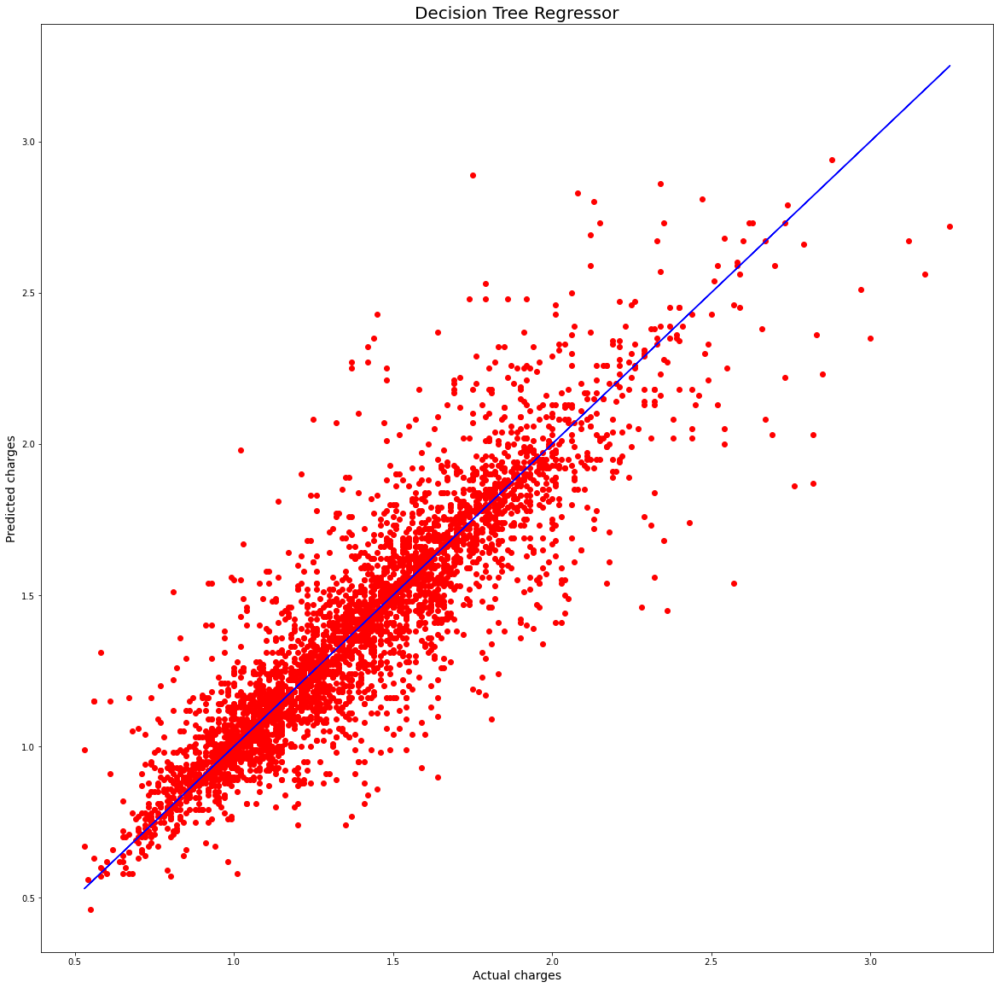

In [115]:
import matplotlib.pyplot as plt
plt.scatter (x=y_test,y=pred_test,color='r')

plt.plot(y_test,y_test,color='b')

plt.xlabel('Actual charges' ,fontsize=14)

plt.ylabel('Predicted charges', fontsize=14)
plt.title('Decision Tree Regressor' , fontsize=20)
plt. show()

#### WE can see that the data's are scattered on the best fit line and it works much better than Linear Regression

# Now Lets take KNeighborsRegressor

In [116]:
from sklearn.neighbors import KNeighborsRegressor
knn=KNeighborsRegressor()

In [117]:
for i in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=i)
    knn.fit(x_train,y_train)
    pred_train=knn.predict(x_train)
    pred_test=knn.predict(x_test)
    print (f"At random state {i},the training accuracy is :- {r2_score(y_train,pred_train)}")
    print (f"At random state {i},the testing accuracy is :- {r2_score(y_test,pred_test)}")
    print ("\n\n")

At random state 0,the training accuracy is :- 0.6878109230048057
At random state 0,the testing accuracy is :- 0.5220740527023529



At random state 1,the training accuracy is :- 0.6874239554098109
At random state 1,the testing accuracy is :- 0.5263738570880132



At random state 2,the training accuracy is :- 0.6873879910103438
At random state 2,the testing accuracy is :- 0.5049849677574277



At random state 3,the training accuracy is :- 0.6869905203149516
At random state 3,the testing accuracy is :- 0.5091765324351929



At random state 4,the training accuracy is :- 0.6843175001794712
At random state 4,the testing accuracy is :- 0.5230582690077701



At random state 5,the training accuracy is :- 0.6901646954813673
At random state 5,the testing accuracy is :- 0.5187701390027876



At random state 6,the training accuracy is :- 0.6874478370059602
At random state 6,the testing accuracy is :- 0.5247650388137743



At random state 7,the training accuracy is :- 0.6838491908446418
At random s

At random state 62,the training accuracy is :- 0.6839627397972303
At random state 62,the testing accuracy is :- 0.537198590390898



At random state 63,the training accuracy is :- 0.6836996855306255
At random state 63,the testing accuracy is :- 0.5356403042396092



At random state 64,the training accuracy is :- 0.6854467294332778
At random state 64,the testing accuracy is :- 0.5149521557875324



At random state 65,the training accuracy is :- 0.6903381544930292
At random state 65,the testing accuracy is :- 0.508130073177272



At random state 66,the training accuracy is :- 0.6825472847264669
At random state 66,the testing accuracy is :- 0.5425513318851605



At random state 67,the training accuracy is :- 0.6846231749793559
At random state 67,the testing accuracy is :- 0.5299863664267814



At random state 68,the training accuracy is :- 0.683700670827062
At random state 68,the testing accuracy is :- 0.5223632350667484



At random state 69,the training accuracy is :- 0.6771450368652194

#### We are taking 51 as a random state bcz here the difference between training and testing is not much

In [118]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=51)


In [119]:
knn.fit(x_train,y_train)

KNeighborsRegressor()

In [120]:
pred_test=knn.predict(x_test)

In [121]:
print (r2_score(y_test,pred_test))

0.5408334206513068


#### r2_score is 54% as we can see above

In [122]:
print (' **ERROR** ')

print ('Mean Absolute Error :->',mean_absolute_error(y_test,pred_test))
print ('Mean Squared Error :->',mean_squared_error(y_test,pred_test))

print ('Root Mean Squared Error :->',np.sqrt(mean_squared_error(y_test,pred_test)))

 **ERROR** 
Mean Absolute Error :-> 0.19487506849315064
Mean Squared Error :-> 0.07414621917808219
Root Mean Squared Error :-> 0.2722980337389203


## CV of KNeighborsRegressor

In [123]:
Train_accuracy=r2_score(y_train,pred_train)
Test_accuracy=r2_score(y_test,pred_test)

from sklearn.model_selection import cross_val_score

for i in range(2,10):
    cv_score=cross_val_score(knn,x,y,cv=i)
    cv_mean=cv_score.mean()
    print (f"At cross fold {i} the cv score is {cv_mean} and accuracy score for training is {Train_accuracy} and accuracy for testing is {Test_accuracy}")
    print ("\n\n")

At cross fold 2 the cv score is -2.1597775014442 and accuracy score for training is -0.6540522572665015 and accuracy for testing is 0.5408334206513068



At cross fold 3 the cv score is -0.8620377470560782 and accuracy score for training is -0.6540522572665015 and accuracy for testing is 0.5408334206513068



At cross fold 4 the cv score is -0.44611803735071986 and accuracy score for training is -0.6540522572665015 and accuracy for testing is 0.5408334206513068



At cross fold 5 the cv score is -0.0459419555154984 and accuracy score for training is -0.6540522572665015 and accuracy for testing is 0.5408334206513068



At cross fold 6 the cv score is -0.22382637933367985 and accuracy score for training is -0.6540522572665015 and accuracy for testing is 0.5408334206513068



At cross fold 7 the cv score is -0.08797518867434127 and accuracy score for training is -0.6540522572665015 and accuracy for testing is 0.5408334206513068



At cross fold 8 the cv score is -0.13854692783522066 and a

#### The cross validation is not considerable in case of KNeighbors Regressor bcz it is in negative

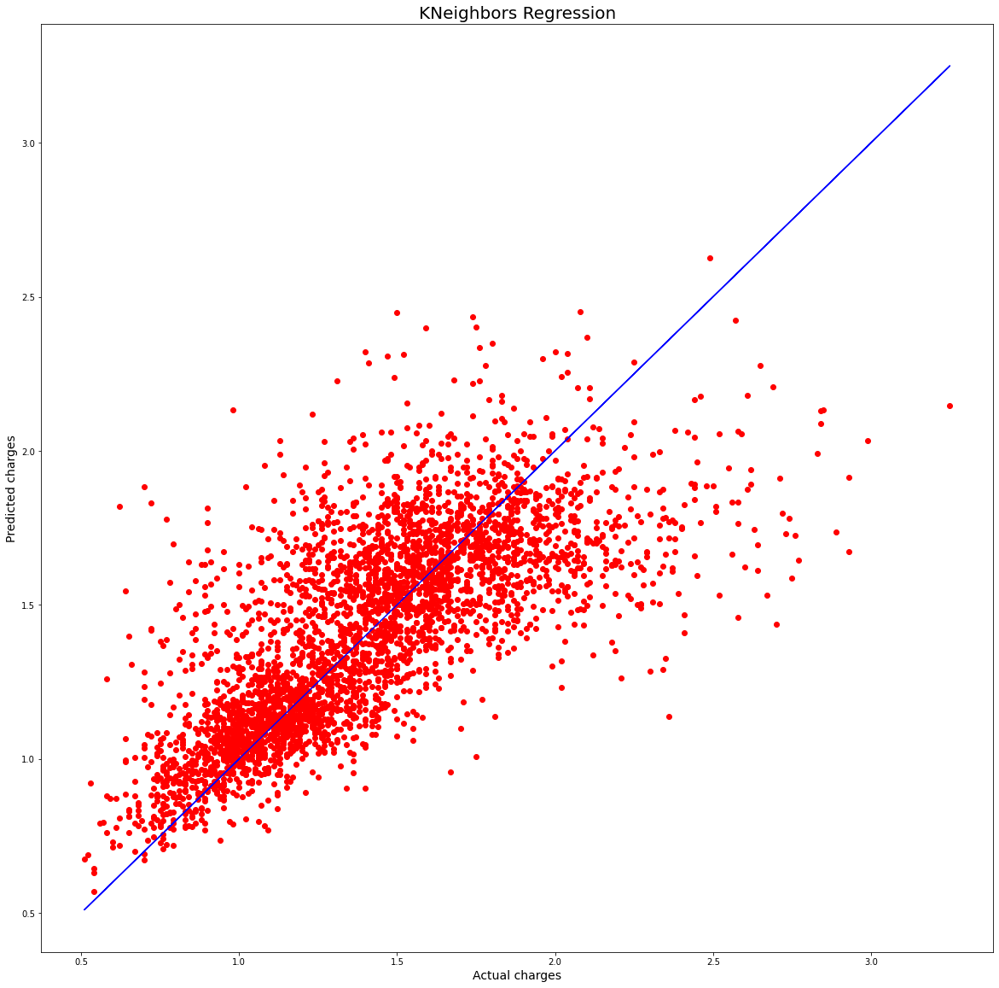

In [124]:
plt.scatter (x=y_test,y=pred_test,color='r')

plt.plot(y_test,y_test,color='b')

plt.xlabel('Actual charges' ,fontsize=14)

plt.ylabel('Predicted charges', fontsize=14)
plt.title('KNeighbors Regression' , fontsize=20)
plt. show()

#### WE can see that the data's are scattered on the best fit line and it works much better than Linear Regression but the best till now is DTR

# Lets Use some Ensemble Technique

In [125]:
from sklearn.ensemble import RandomForestRegressor

In [126]:
# Bagging Technique (Parallel)
rf=RandomForestRegressor()
for i in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=i)
    rf.fit(x_train,y_train)
    pred_train=rf.predict(x_train)
    pred_test=rf.predict(x_test)
    print (f"At random state {i},the training accuracy is :- {r2_score(y_train,pred_train)}")
    print (f"At random state {i},the testing accuracy is :- {r2_score(y_test,pred_test)}")
    print ("\n\n")

At random state 0,the training accuracy is :- 0.9843302660004519
At random state 0,the testing accuracy is :- 0.8863595582034519



At random state 1,the training accuracy is :- 0.9846591993953966
At random state 1,the testing accuracy is :- 0.8962228890319773



At random state 2,the training accuracy is :- 0.9850560717919463
At random state 2,the testing accuracy is :- 0.8860023768963576



At random state 3,the training accuracy is :- 0.9845730558420696
At random state 3,the testing accuracy is :- 0.894453862593681



At random state 4,the training accuracy is :- 0.9846249603424599
At random state 4,the testing accuracy is :- 0.8840914964786027



At random state 5,the training accuracy is :- 0.9846780780053513
At random state 5,the testing accuracy is :- 0.8894234386543749



At random state 6,the training accuracy is :- 0.9846320810353169
At random state 6,the testing accuracy is :- 0.899889896751282



At random state 7,the training accuracy is :- 0.9844407494081775
At random sta

At random state 62,the training accuracy is :- 0.9842927138467669
At random state 62,the testing accuracy is :- 0.8973007264863718



At random state 63,the training accuracy is :- 0.9845947268356398
At random state 63,the testing accuracy is :- 0.8883396054339147



At random state 64,the training accuracy is :- 0.9848533704277977
At random state 64,the testing accuracy is :- 0.8904559094816703



At random state 65,the training accuracy is :- 0.9849902114241879
At random state 65,the testing accuracy is :- 0.8832511295386991



At random state 66,the training accuracy is :- 0.98473587419458
At random state 66,the testing accuracy is :- 0.8937887229940067



At random state 67,the training accuracy is :- 0.9845083809465678
At random state 67,the testing accuracy is :- 0.8846013678599967



At random state 68,the training accuracy is :- 0.9849055690525609
At random state 68,the testing accuracy is :- 0.8954963093331034



At random state 69,the training accuracy is :- 0.984656462863885

In [127]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=41)

In [128]:
rf.fit(x_train,y_train)

RandomForestRegressor()

In [129]:
pred_test=rf.predict(x_test)

In [130]:
print (r2_score(y_test,pred_test))

0.9031840332832898


#### 90% is r2 in random forest which very good and the best from the rest model


In [131]:
print (' **ERROR** ')

print ('Mean Absolute Error :->',mean_absolute_error(y_test,pred_test))
print ('Mean Squared Error :->',mean_squared_error(y_test,pred_test))

print ('Root Mean Squared Error :->',np.sqrt(mean_squared_error(y_test,pred_test)))

 **ERROR** 
Mean Absolute Error :-> 0.0905996712328767
Mean Squared Error :-> 0.016434637194520547
Root Mean Squared Error :-> 0.12819764894303073


#### The cross validation is not considerable in case of Random forest Regressor bcz it is very less. % of cv score id the max over here

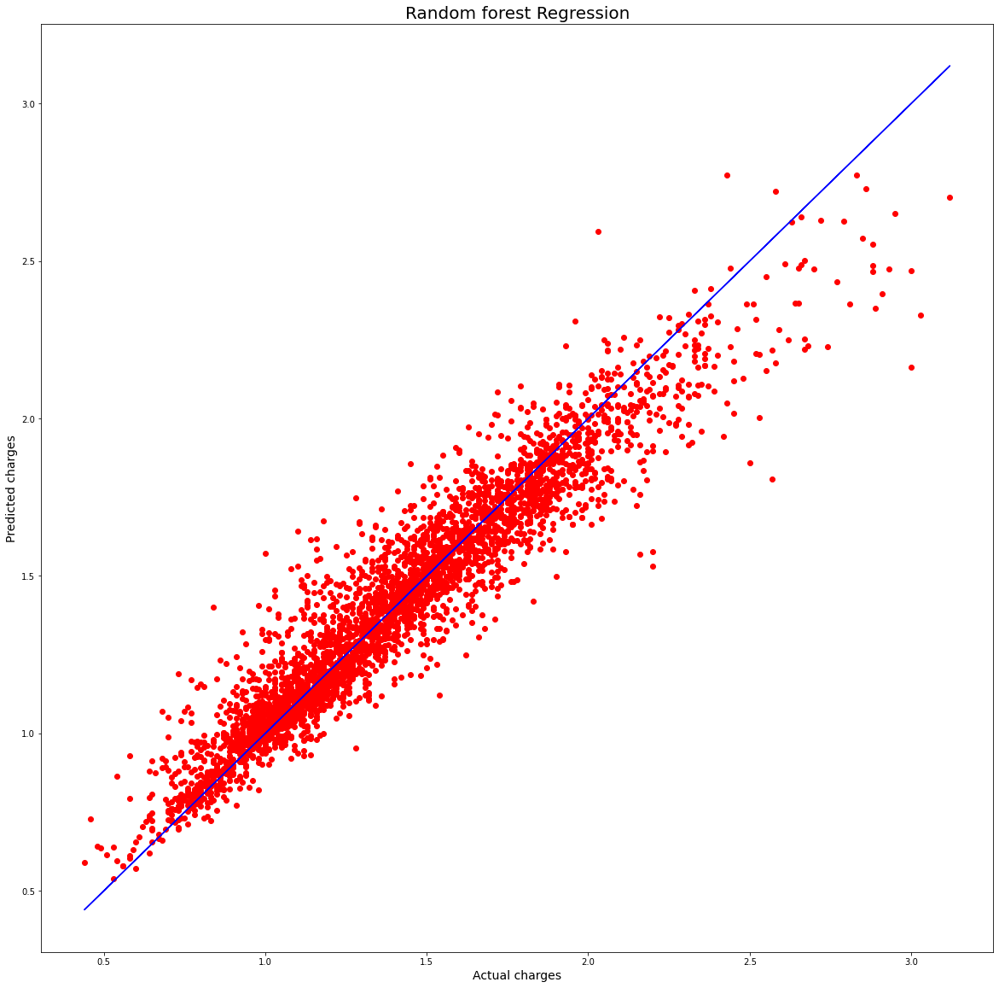

In [132]:
plt.scatter (x=y_test,y=pred_test,color='r')

plt.plot(y_test,y_test,color='b')

plt.xlabel('Actual charges' ,fontsize=14)

plt.ylabel('Predicted charges', fontsize=14)
plt.title('Random forest Regression' , fontsize=20)
plt. show()

#### We can see that the Random forest regressor is Acting as the best regressor till now,we can see that maximum of the data are falling on the best fit line

# Reguralization Technique

In [133]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score


In [134]:
from sklearn.linear_model import Lasso
parameter={'alpha':[.0001,.001,.01,.1,1,10],'random_state':list(range(0,10))}

ls= Lasso()
clf=GridSearchCV(ls,parameter)
clf.fit(x_train,y_train)

print (clf.best_params_)

{'alpha': 0.0001, 'random_state': 0}


In [135]:
ls=Lasso(alpha=0.0001,random_state=0)
ls.fit(x_train,y_train)
ls_score_training = ls.score(x_train,y_train)
pred_ls=ls.predict(x_test)
ls_score_training*100

43.59527245591431

In [136]:
pred_ls=ls.predict(x_test)

In [137]:
lss=r2_score(y_test,pred_ls)
lss*100

44.99408774277356

In [138]:
cv_score=cross_val_score(ls,x,y,cv=5)
cv_mean=cv_score.mean()
cv_mean*100

6.543774127689768

## Ridge

In [139]:
from sklearn.linear_model import Ridge

parameters={'alpha':[0.001,0.01,0.1,1,10],'solver':['auto','svd','cholesky','lsqr','sparse_cg','sag','saga']}
rd=Ridge()
xx=GridSearchCV(rd,parameters)
xx.fit(x_train,y_train)
print(xx.best_params_)

{'alpha': 0.01, 'solver': 'sag'}


In [140]:
rd=Ridge(alpha=10,solver='sag')
rd.fit(x_train,y_train)
rd_score_training = rd.score(x_train,y_train)
pred_rd=rd.predict(x_test)
rd_score_training*100

43.59510325738669

In [141]:
pred_rd=rd.predict(x_test)

In [142]:
rdd=r2_score(y_test,pred_rd)
rdd*100

44.99172584459256

In [143]:
cv_score=cross_val_score(rd,x,y,cv=5)
cv_mean=cv_score.mean()
cv_mean*100

6.5183173695528

<h2 style='text-align:center;font-size:30px;background-color:Black;border:30px;color:white'> *Now Lets consider model which Model should we go for as a final model* <h2>

In [144]:
mm=pd.DataFrame([["Linear Regression","44%"],["Decision Tree Regressor","77%"],["KNeighbors Regressor","54%"],["Random Forest Regressor","90%"],["Lasso","44%"],["Ridge","44%"]],
                    columns=["Model_Name","R2_SCORE"])

mm

,Model_Name,R2_SCORE
0,Linear Regression,44%
1,Decision Tree Regressor,77%
2,KNeighbors Regressor,54%
3,Random Forest Regressor,90%
4,Lasso,44%
5,Ridge,44%


### We will take random forest as a Final model bcz it is performing the best 

# Hyper Parameter Tuning

In [145]:
rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [146]:
parameter={'criterion' :['mse','mae'],
          'max_features':['auto','sqrt','log2']}
rf=RandomForestRegressor()
clf=GridSearchCV(rf,parameter)
clf.fit(x_train,y_train)


print (clf.best_params_)

{'criterion': 'mse', 'max_features': 'auto'}


#### Not Doing 4 parameter Because my jupyter notebook took almost 45 min to process this 

In [149]:

rf=RandomForestRegressor(criterion='mse',max_features='auto')
rf.fit(x_train,y_train)
rf.score(x_train,y_train)
pred_decision= rf.predict(x_test)

rfs=r2_score(y_test,pred_decision)
print ('R2 Score :',rfs*100)



R2 Score : 90.14005835019489


#### Not Doing CV bcz it taking more than an Hour to do so ..I kNow the process But Bcz of Jupyrt notebook cant go for it ,even google collab is also taking alot of time

# Now save the final model

In [150]:
#Saving the model using .pkl
import joblib
joblib.dump(rf,"Avocadostudy.pkl")

['Avocadostudy.pkl']

# Prediction

In [151]:
#Loading the saved model
aa=joblib.load("Avocadostudy.pkl")


In [152]:
#Prediction
prediction = aa.predict(x_test)
prediction

array([1.6528, 1.6982, 1.8705, ..., 1.6479, 1.338 , 1.8001])

In [153]:
pd.DataFrame([aa.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])

,0,1,2,3,4,5,6,7,8,9,...,3640,3641,3642,3643,3644,3645,3646,3647,3648,3649
Predicted,1.6528,1.6982,1.8705,1.8568,0.7417,1.9474,1.0223,0.8002,1.2221,1.1157,...,1.9394,1.3679,1.9224,2.0278,1.9674,1.6635,1.2415,1.6479,1.338,1.8001
Original,1.4100,1.7300,1.8200,1.9000,0.7100,1.6600,1.1100,0.8100,1.2600,1.0300,...,1.8000,1.0800,1.9700,2.3100,1.9600,1.7400,1.3700,1.6400,1.370,1.8100


# It is making a good Prediction and the difference between Original and Predicted is not much 

# ---------------------------------------------------------------------------

# This Project is completed here for Regression Side

# --------------------------------------------------------------------------

<h2 style='text-align:center;font-size:30px;background-color:Black;border:30px;color:white'> * Now Let do Classification * <h2>

<h2 style='text-align:center;font-size:30px;background-color:Black;border:30px;color:white'> * Here we will consider column=type for Classification * <h2>

# We have already done with Eveything to process the data Now Lets split the x and y according to classification type

In [155]:
df_new

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,-0.117824,-0.075324,-0.657421,0.351430,-0.222566,-0.537507,-0.347421,-0.781153,-0.677919,0,2015,0,12,27
1,-0.064330,-0.147497,-0.777179,0.269513,-0.175223,-0.498128,-0.311322,-0.771198,-0.677919,0,2015,0,12,20
2,-1.298865,0.205556,-0.731776,0.649333,0.023923,-0.566369,-0.374453,-0.758523,-0.677919,0,2015,0,12,13
3,-0.829026,0.019655,-0.632592,0.468799,-0.121164,-0.713068,-0.510991,-0.699123,-0.677919,0,2015,0,12,6
4,-0.253635,-0.180674,-0.684504,0.262126,-0.110491,-0.686312,-0.490534,-0.607027,-0.677919,0,2015,0,11,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,0.639410,-0.678214,-0.462066,-0.926028,-1.228986,-0.340422,-0.175753,-0.412401,-0.677919,1,2018,53,2,4
18245,0.826487,-0.771326,-0.618019,-0.670600,-1.228986,-0.509513,-0.331971,-0.484991,-0.677919,1,2018,53,1,28
18246,1.184324,-0.775274,-0.617966,-0.778893,0.445710,-0.503366,-0.313756,-0.950743,-0.677919,1,2018,53,1,21
18247,1.313296,-0.701797,-0.547011,-0.716371,0.445399,-0.434176,-0.250408,-0.916068,-0.677919,1,2018,53,1,14


In [158]:
x=df.loc [:,df.columns != 'type']

In [160]:
x.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,region,Month,Day
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,2015,0,12,27
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,2015,0,12,20
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,2015,0,12,13
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,2015,0,12,6
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,2015,0,11,29


In [161]:
y=df.loc[:,'type']
y.head()

0    0
1    0
2    0
3    0
4    0
Name: type, dtype: int32

# Balancing the dataset over here,otherwise it will be a baised dataset

In [162]:
from imblearn.over_sampling import SMOTE

In [163]:
smt=SMOTE()
x,y=smt.fit_resample(x,y)

In [164]:
x.shape

(18252, 13)

In [165]:
y.shape

(18252,)

In [166]:
y.value_counts()

0    9126
1    9126
Name: type, dtype: int64

### Now our dataset is balanced

<AxesSubplot:xlabel='type', ylabel='count'>

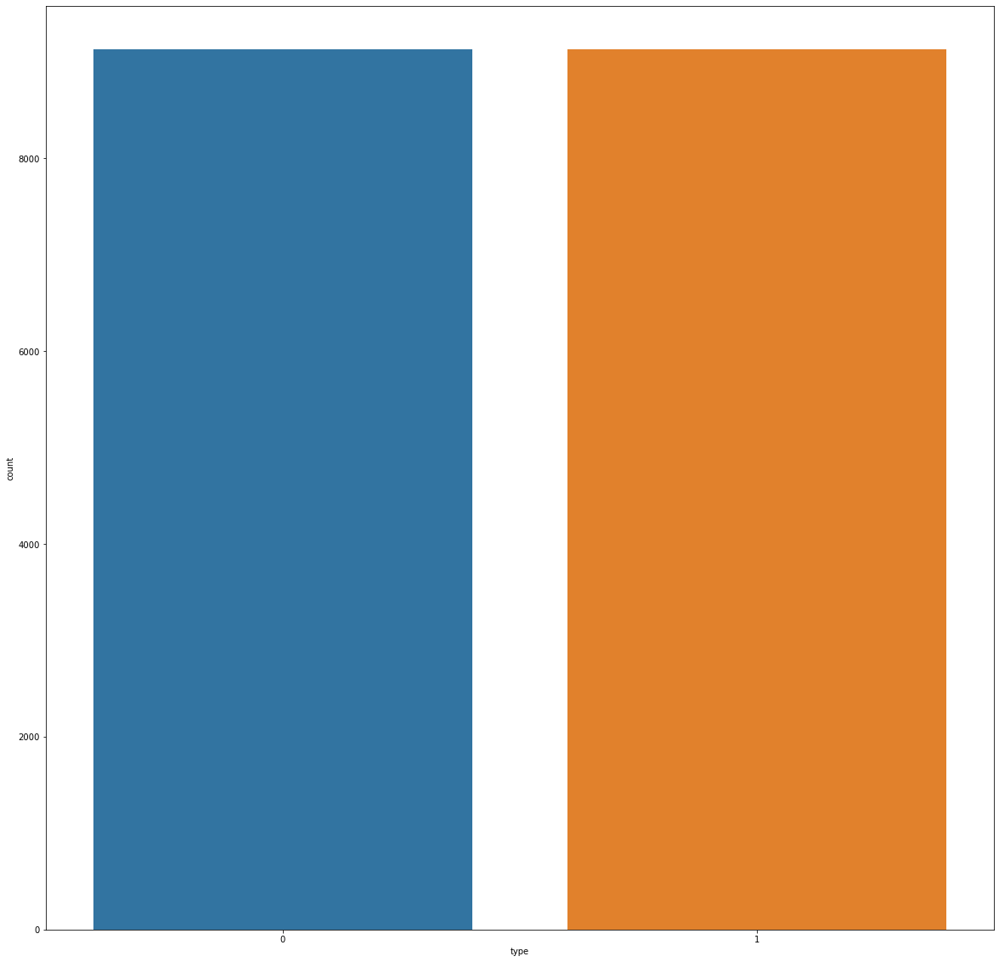

In [167]:
sns.countplot(y)

### Both 0 and 1 are equally balanced

In [168]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
from sklearn.metrics import accuracy_score

## Logistic Regression

In [169]:
lr=LogisticRegression()
for i in range(0,1000):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=i,test_size=0.20)
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    if round(accuracy_score(pred_train,y_train)*100,1)==round(accuracy_score(y_test,pred_test)*100,1):
        print("At random state ",i," The model performs very well")
        print("At random_state:-",i)
        print("Training accuaracy_score is :-",round(accuracy_score(y_train,pred_train)*100,1))
        print("Testing accuracy_score is:-",round(accuracy_score(y_test,pred_test)*100,1),  '\n\n')

At random state  8  The model performs very well
At random_state:- 8
Training accuaracy_score is :- 93.3
Testing accuracy_score is:- 93.3 


At random state  17  The model performs very well
At random_state:- 17
Training accuaracy_score is :- 93.4
Testing accuracy_score is:- 93.4 


At random state  18  The model performs very well
At random_state:- 18
Training accuaracy_score is :- 93.3
Testing accuracy_score is:- 93.3 


At random state  32  The model performs very well
At random_state:- 32
Training accuaracy_score is :- 93.3
Testing accuracy_score is:- 93.3 


At random state  39  The model performs very well
At random_state:- 39
Training accuaracy_score is :- 93.4
Testing accuracy_score is:- 93.4 


At random state  60  The model performs very well
At random_state:- 60
Training accuaracy_score is :- 93.5
Testing accuracy_score is:- 93.5 


At random state  66  The model performs very well
At random_state:- 66
Training accuaracy_score is :- 93.1
Testing accuracy_score is:- 93.1 


A

At random state  675  The model performs very well
At random_state:- 675
Training accuaracy_score is :- 93.3
Testing accuracy_score is:- 93.3 


At random state  685  The model performs very well
At random_state:- 685
Training accuaracy_score is :- 93.3
Testing accuracy_score is:- 93.3 


At random state  699  The model performs very well
At random_state:- 699
Training accuaracy_score is :- 93.1
Testing accuracy_score is:- 93.1 


At random state  709  The model performs very well
At random_state:- 709
Training accuaracy_score is :- 93.2
Testing accuracy_score is:- 93.2 


At random state  719  The model performs very well
At random_state:- 719
Training accuaracy_score is :- 93.0
Testing accuracy_score is:- 93.0 


At random state  727  The model performs very well
At random_state:- 727
Training accuaracy_score is :- 93.2
Testing accuracy_score is:- 93.2 


At random state  743  The model performs very well
At random_state:- 743
Training accuaracy_score is :- 93.2
Testing accuracy_scor

In [170]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=917)

In [171]:
lr.fit(x_train,y_train)

LogisticRegression()

In [172]:
pred_train=lr.predict(x_train)

In [173]:
pred_test=lr.predict(x_test)

In [174]:
accuracy_score(y_test,pred_test)

0.9356340728567516

In [175]:
from sklearn.metrics import classification_report

In [176]:
print(classification_report(y_test,pred_test))

              precision    recall  f1-score   support

           0       0.97      0.90      0.93      1782
           1       0.91      0.97      0.94      1869

    accuracy                           0.94      3651
   macro avg       0.94      0.93      0.94      3651
weighted avg       0.94      0.94      0.94      3651



# CROSS VALIDATION FOR LOGISTICS REGRESSION

In [177]:
pred_lr=lr.predict(x_test)
from sklearn.model_selection import cross_val_score
lss=accuracy_score(y_test,pred_lr)

In [178]:
for i in range(4,10):
    lsscore=cross_val_score(lr,x,y,cv=i)
    lsc=lsscore.mean()
    print ("At cv:-",i)
    print ("Cross validation score is :-",lsc*100)
    print ("Accuracy_score is :-",lss*100)
    print ("\n")

At cv:- 4
Cross validation score is :- 93.01446416831031
Accuracy_score is :- 93.56340728567515


At cv:- 5
Cross validation score is :- 93.03637134506214
Accuracy_score is :- 93.56340728567515


At cv:- 6
Cross validation score is :- 93.15143545912777
Accuracy_score is :- 93.56340728567515


At cv:- 7
Cross validation score is :- 92.8611266034579
Accuracy_score is :- 93.56340728567515


At cv:- 8
Cross validation score is :- 92.84450415561851
Accuracy_score is :- 93.56340728567515


At cv:- 9
Cross validation score is :- 93.13499890422966
Accuracy_score is :- 93.56340728567515




#### We have taken here cv as 9 bcz it it close to accuracy score

In [179]:
lsscore_selected= cross_val_score(lr,x,y,cv=9).mean()
print ("The cv score is :- ",lsscore_selected,"\nThe accuracy_score is:",lss)

The cv score is :-  0.9313499890422966 
The accuracy_score is: 0.9356340728567516


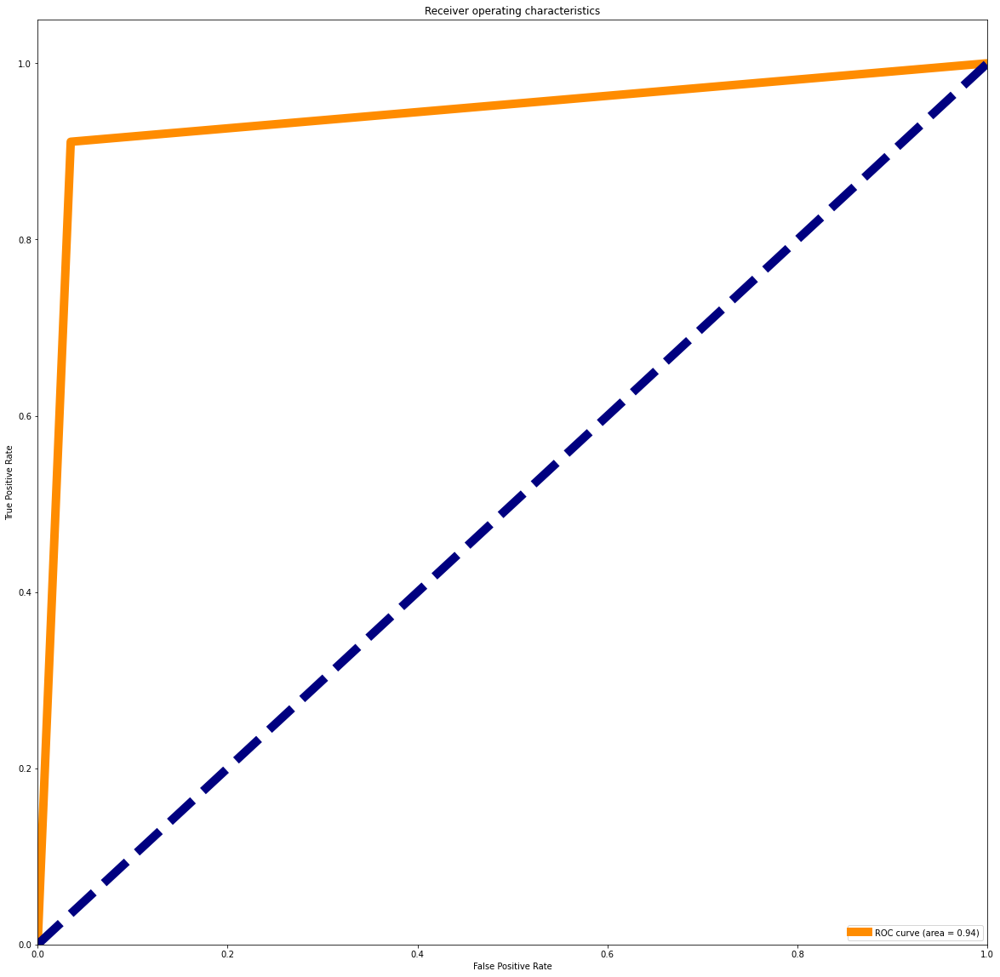

In [180]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

### We can see that Our area under RoC curve is =94% Very good.,bcz the more the area is under the curve more the accuracy will be

# Lets Try Multiple Classification model

In [181]:
from sklearn.metrics import confusion_matrix

In [182]:
def model_selection(algorithm_instance,x_train,y_train,x_test,y_test):
    algorithm_instance.fit(x_train,y_train)
    model_1_pred_train=algorithm_instance.predict(x_train)
    model_1_pred_test=algorithm_instance.predict(x_test)
    print ('accuracy of training model :-',accuracy_score(y_train,model_1_pred_train))
    print ('accuracy of test data :-',accuracy_score(y_test,model_1_pred_test))
    print ('classification report for test data \n', classification_report(y_test,model_1_pred_test))
    print ('classification report for test data \n', classification_report(y_train,model_1_pred_train))
    print ('confusion matrix : \n',confusion_matrix(y_test,model_1_pred_test))

In [183]:
# Logistics regression score
model_selection(lr,x_train,y_train,x_test,y_test)

accuracy of training model :- 0.9357578248065201
accuracy of test data :- 0.9356340728567516
classification report for test data 
               precision    recall  f1-score   support

           0       0.97      0.90      0.93      1782
           1       0.91      0.97      0.94      1869

    accuracy                           0.94      3651
   macro avg       0.94      0.93      0.94      3651
weighted avg       0.94      0.94      0.94      3651

classification report for test data 
               precision    recall  f1-score   support

           0       0.97      0.90      0.93      7344
           1       0.90      0.97      0.94      7257

    accuracy                           0.94     14601
   macro avg       0.94      0.94      0.94     14601
weighted avg       0.94      0.94      0.94     14601

confusion matrix : 
 [[1605  177]
 [  58 1811]]


In [184]:
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier()

model_selection(dt,x_train,y_train,x_test,y_test)

accuracy of training model :- 1.0
accuracy of test data :- 0.9923308682552725
classification report for test data 
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      1782
           1       0.99      0.99      0.99      1869

    accuracy                           0.99      3651
   macro avg       0.99      0.99      0.99      3651
weighted avg       0.99      0.99      0.99      3651

classification report for test data 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      7344
           1       1.00      1.00      1.00      7257

    accuracy                           1.00     14601
   macro avg       1.00      1.00      1.00     14601
weighted avg       1.00      1.00      1.00     14601

confusion matrix : 
 [[1767   15]
 [  13 1856]]


### Decision Tree is performing good 

In [185]:
from sklearn.neighbors import KNeighborsClassifier
kn=KNeighborsClassifier()

model_selection(kn,x_train,y_train,x_test,y_test)

accuracy of training model :- 0.98431614272995
accuracy of test data :- 0.974801424267324
classification report for test data 
               precision    recall  f1-score   support

           0       0.97      0.98      0.97      1782
           1       0.98      0.97      0.98      1869

    accuracy                           0.97      3651
   macro avg       0.97      0.97      0.97      3651
weighted avg       0.97      0.97      0.97      3651

classification report for test data 
               precision    recall  f1-score   support

           0       0.98      0.99      0.98      7344
           1       0.99      0.98      0.98      7257

    accuracy                           0.98     14601
   macro avg       0.98      0.98      0.98     14601
weighted avg       0.98      0.98      0.98     14601

confusion matrix : 
 [[1746   36]
 [  56 1813]]


### KNeighbors classifier is also performing good but the best one till now is DTC

In [186]:
from sklearn.svm import SVC
sv=SVC()

model_selection(sv,x_train,y_train,x_test,y_test)

accuracy of training model :- 0.8971988219984932
accuracy of test data :- 0.9016707751301013
classification report for test data 
               precision    recall  f1-score   support

           0       0.94      0.85      0.89      1782
           1       0.87      0.95      0.91      1869

    accuracy                           0.90      3651
   macro avg       0.91      0.90      0.90      3651
weighted avg       0.90      0.90      0.90      3651

classification report for test data 
               precision    recall  f1-score   support

           0       0.94      0.85      0.89      7344
           1       0.86      0.95      0.90      7257

    accuracy                           0.90     14601
   macro avg       0.90      0.90      0.90     14601
weighted avg       0.90      0.90      0.90     14601

confusion matrix : 
 [[1522  260]
 [  99 1770]]


## SVC is not performing as good as DTC and KNN

##  Hyper Parameter Tuning

In [201]:
mm=pd.DataFrame([["Logistic Regression","94%"],["Decision Tree Classifier","100%"],["KNeighbors Classifier","98%"]],
                    columns=["Model_Name","R2_SCORE"])

mm

,Model_Name,R2_SCORE
0,Logistic Regression,94%
1,Decision Tree Classifier,100%
2,KNeighbors Classifier,98%


# We will take decision tree as a final model

In [202]:
dt.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

In [204]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"],'random_state':list(range(0,100))
}

In [206]:
xx=GridSearchCV(dt,params)
xx.fit(x_train,y_train)
print(xx.best_params_)

{'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 5, 'random_state': 86}


In [207]:
dt=DecisionTreeClassifier(criterion='entropy',max_depth=20,min_samples_leaf=5,random_state=86)
dt.fit(x_train,y_train)
dt_score_training = dt.score(x_train,y_train)
pred_dt=dt.predict(x_test)
dt_score_training*100

99.6712553934662

# Now save the Final model

In [208]:
#Saving the model using .pkl
import joblib
joblib.dump(dt,"Avo_Classifi.pkl")

['Avo_Classifi.pkl']

# Prediciton

In [209]:
#Loading the saved model
aa=joblib.load("Avo_Classifi.pkl")


In [210]:
#Prediction
prediction = aa.predict(x_test)
prediction

array([1, 0, 0, ..., 0, 0, 1])

In [211]:
pd.DataFrame([aa.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])

,0,1,2,3,4,5,6,7,8,9,...,3641,3642,3643,3644,3645,3646,3647,3648,3649,3650
Predicted,1,0,0,1,0,1,1,1,1,0,...,1,0,0,1,1,1,0,0,0,1
Original,1,0,0,1,0,1,1,1,1,0,...,1,0,0,1,1,1,0,0,0,1


# Here the result is same ..Model is performing Perfect

# Both classiication and regression done in the same file

# ----------------------------------------------------------------------------